In [ ]:
#IMPORT all necessary libraries and modules

#add path to sys so that we can import functions from other folders
import sys
import os

sys.path.append(r'C:\Users\tfarotimi\United Nations\Contexto Proyecciones Sector Externo - ProyectoAutomatización\Dev\Inflation Forecasting\lib')

#import libraries 
import pandas as pd
import numpy as np
import plotly.graph_objs as go
import plotly.offline as pyo
from plotly.subplots import make_subplots
pyo.init_notebook_mode()
import nbformat

import matplotlib.pyplot as plt
import seaborn as sns



#tqdm
from tqdm import tqdm

from monthly_forecast_run import run_monthly_forecast
from excel_agg_forecast import create_aggregate_report
from excel_forecast_report import create_forecast_report

from helper_functions import load_data
import pickle



#scikit-learn
#randomforestregessor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error,r2_score



#statsmodels
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.tsa.statespace.varmax import VARMAX

from models import arima, sarimax, varmax, var_model
from model_search import run_models

import pmdarima as pm
#from pm.arima import ADFTest


#import functions from modules
from helper_functions import load_data, read_inflation_data, merge_exogenous_data, grangers_causation_matrix, get_best_predictors, run_var_for_all_combos
from dashboard import model_compare, r2_compare, error_compare
from residuals_analysis import analyze_residuals
from forecast import get_forecast 
import armagarch as ag

#import modules
import importlib
import models
import helper_functions
import dashboard
import residuals_analysis
import forecast
import armagarch as ag


#reload modules to ensure that changes made to them are reflected in the notebook
importlib.reload(models)
importlib.reload(helper_functions)
importlib.reload(dashboard)
importlib.reload(residuals_analysis)
importlib.reload(forecast)


%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from statsmodels.tsa.api import acf, graphics, pacf
from statsmodels.tsa.ar_model import AutoReg, ar_select_order
import datetime as dt

import regex as re

sns.set_style("darkgrid")
pd.plotting.register_matplotlib_converters()
# Default figure size
sns.mpl.rc("figure", figsize=(16, 6))
sns.mpl.rc("font", size=14)

#disable warnings
import warnings
warnings.filterwarnings("ignore")



KeyboardInterrupt: 

In [ ]:
#ignore warnings
import warnings
warnings.filterwarnings('ignore')


In [ ]:
import pandas as pd
#create variables for each file path where data is stored

#file path for inflation data in standardized format in Excel (Nico's table)
INFL_DATA_FILE_NAME = r'dat/2023/October/Inflation_Data_Raw_102023.xlsx'

#file path for Excel file containing exogenous variable data for each country
CHL_EXOG_FILE_NAME = r'dat/2024/January/Banco de Chile Time Series.xlsx'




#call function to read in inflation data and exogenous variable data and save it to a dictionary for each region 
#SUR_data, CEN_data, CAR_data, REG_data = read_inflation_data(INFL_DATA_FILE_NAME)

CHL_data =     df = pd.read_excel(CHL_EXOG_FILE_NAME, sheet_name = 'Sheet1')
#set index
CHL_data.set_index('Period', inplace = True)



In [ ]:
#RESAMPLE chl_data_iter_2 to quarterly data
# CHL_data = SUR_data['CHL']

#read sheet names from CHL-EXOG_FILE_NAME
sheet_names = pd.ExcelFile(CHL_EXOG_FILE_NAME).sheet_names


for sheet in sheet_names[1:]: 

    df = pd.read_excel(CHL_EXOG_FILE_NAME, sheet_name = sheet)
        
    #set index to Period'
    df.set_index('Period', inplace = True)
    #convert index to datetime
    df.index = pd.to_datetime(df.index)
    
    if 'raw' in sheet:
        #get percent change from same period last year
        df = df.pct_change(12)
        df = df.dropna()

    if 'quarterly' in sheet:
        df = df.resample('MS').interpolate(method='linear')

    #merge exogenous variable data with inflation data
    CHL_data = pd.merge(CHL_data, df, how = 'left', left_index = True, right_index = True)
    
    
CHL_data = CHL_data

CHL_data.tail()

#show missing values as heatmap
#sns.heatmap(CHL_data.isnull(), cbar=False)


,YoY Increase Inflation,PPI_China,"PPI_United States, Finished goods",Deposit Interest Rates (30 - 90 days) -Nominal,Exports,Imports,M1_money_supply,Real Exchange Rate,Expectativas de inflación en 11 meses,MPR_Chile,Price of troy ounce of gold (dollars/oz),Price of troy ounce of silver (dollars/oz),BML price of refined copper (dollars/pound),CPI_United States,General wage index,Wage Index_yoy %,Unemployment rate,Unemplyment rate yoy
Period,,,,,,,,,,,,,,,,,,
2023-11-01,4.215618,-3.0,-1.1,8.27,442.481008,475.952304,-0.047243,-5.698466,3.3,9.000000,14.813444,11.502523,1.793286,3.1,8.3,-23.148148,8.732412,9.857925
2023-12-01,3.374501,-2.7,-0.2,7.89,449.708152,471.077060,-0.028441,-3.965675,3.1,8.723684,13.195708,2.520444,0.321253,3.4,7.7,-28.703704,8.475639,7.794863
2024-01-01,3.234452,NaN,NaN,7.41,457.638768,462.718040,-0.005740,NaN,3.0,8.250000,6.800000,-3.500000,-7.300000,NaN,NaN,NaN,8.400000,4.513434
2024-02-01,3.566657,NaN,NaN,6.57,465.569384,454.359020,0.007173,NaN,3.0,7.250000,9.300000,-3.500000,-7.200000,NaN,NaN,NaN,8.500000,1.581801
2024-03-01,3.209628,NaN,NaN,6.40,473.500000,446.000000,-0.002432,NaN,NaN,7.250000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
CHL_data.loc['2023-02-01']

YoY Increase Inflation                             12.313190
PPI_China                                          -1.400000
PPI_United States, Finished goods                   6.300000
Deposit Interest Rates (30 - 90 days) -Nominal     11.080000
Exports                                           496.305152
Imports                                           481.977030
M1_money_supply                                    -0.240262
Real Exchange Rate                                -11.995432
Expectativas de inflación en 11 meses               5.000000
MPR_Chile                                          11.250000
Price of troy ounce of gold (dollars/oz)           -0.324246
Price of troy ounce of silver (dollars/oz)         -6.907264
BML price of refined copper (dollars/pound)        -9.919679
CPI_United States                                   6.000000
General wage index                                 11.200000
Wage Index_yoy %                                   47.368421
Unemployment rate       

<AxesSubplot: ylabel='Period'>

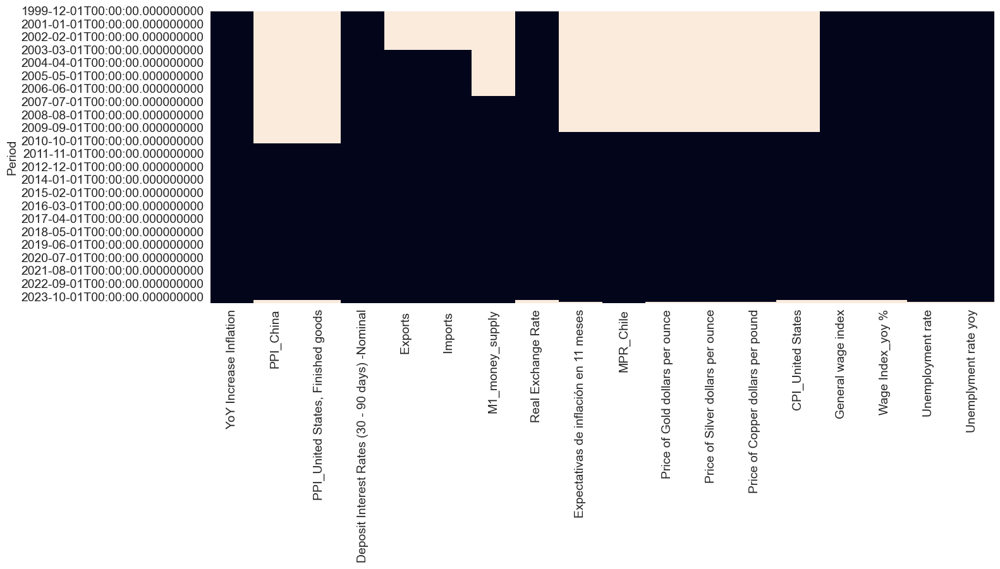

In [ ]:
#rename price of troy ounce of gold column in CHL_ data to 'Price of Gold dollars per ounce'
CHL_data.rename(columns = {'Price of troy ounce of gold (dollars/oz)': 'Price of Gold dollars per ounce'}, inplace = True)
CHL_data.rename(columns = {'Price of troy ounce of silver (dollars/oz)': 'Price of Silver dollars per ounce'}, inplace = True)
CHL_data.rename(columns = {'BML price of refined copper (dollars/pound)': 'Price of Copper dollars per pound'}, inplace = True)
#rename real exchange rate in CHL_data to 'Real Exchange Rate'
CHL_data.rename(columns = {'Real Exchange Rate ': 'Real Exchange Rate'}, inplace = True)


#CHL_data = CHL_data.drop(columns = remove)
#drop all components
#CHL_data = CHL_data.drop(columns = [col for col in CHL_data.columns if '.CPI' in col])




#show missing values as heatmap
sns.heatmap(CHL_data.isnull(), cbar=False)

In [ ]:
CHL_data_02_24 = CHL_data.loc['20101201':].select_dtypes('float64')
CHL_data_02_24

,YoY Increase Inflation,PPI_China,"PPI_United States, Finished goods",Deposit Interest Rates (30 - 90 days) -Nominal,Exports,Imports,M1_money_supply,Real Exchange Rate,Expectativas de inflación en 11 meses,MPR_Chile,Price of Gold dollars per ounce,Price of Silver dollars per ounce,Price of Copper dollars per pound,CPI_United States,General wage index,Wage Index_yoy %,Unemployment rate,Unemplyment rate yoy
Period,,,,,,,,,,,,,,,,,,
2010-12-01,2.972868,5.9,3.8,3.72,398.346084,372.982959,0.212838,-3.688219,3.200,3.119048,23.612110,66.681062,31.017473,1.5,4.740828,-4.620704,7.210129,-16.323341
2011-01-01,2.719268,6.6,3.7,3.72,395.634837,375.587529,0.196305,1.920843,3.550,3.250000,21.822495,60.688379,29.371467,1.6,5.683837,152.612128,7.441762,-14.047313
2011-02-01,2.667120,7.2,5.5,3.84,392.923590,378.192099,0.160117,-4.502511,3.800,3.337500,25.255469,95.685543,44.090839,2.1,5.811209,122.374119,7.442769,-12.746220
2011-03-01,3.365293,7.3,5.7,4.20,390.212342,380.796670,0.128253,-2.128884,4.045,3.717391,27.661541,109.905608,27.708255,2.7,6.310297,169.982806,7.548117,-18.200636
2011-04-01,3.217911,6.8,6.7,4.68,397.354532,391.305707,0.137277,-1.842169,4.000,4.300000,29.194572,137.504546,22.442405,3.2,5.941463,85.567971,7.211112,-18.389908
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-01,4.215618,-3.0,-1.1,8.27,442.481008,475.952304,-0.047243,-5.698466,3.300,9.000000,14.813444,11.502523,1.793286,3.1,8.300000,-23.148148,8.732412,9.857925
2023-12-01,3.374501,-2.7,-0.2,7.89,449.708152,471.077060,-0.028441,-3.965675,3.100,8.723684,13.195708,2.520444,0.321253,3.4,7.700000,-28.703704,8.475639,7.794863
2024-01-01,3.234452,NaN,NaN,7.41,457.638768,462.718040,-0.005740,NaN,3.000,8.250000,6.800000,-3.500000,-7.300000,NaN,NaN,NaN,8.400000,4.513434


In [ ]:
#imput nmissing values in CHL_data_02_24 with MICE
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import ExtraTreesRegressor



#impute missing values in CHL_data_02_24
imputer = IterativeImputer(estimator=ExtraTreesRegressor(), max_iter=10, random_state=0)
CHL_data_02_24_imputed = imputer.fit_transform(CHL_data_02_24)

#convert imputed data to dataframe
CHL_data_02_24_imputed = pd.DataFrame(CHL_data_02_24_imputed, columns = CHL_data_02_24.columns, index = CHL_data_02_24.index)

CHL_data_02_24 = CHL_data_02_24_imputed
CHL_data_02_24

,YoY Increase Inflation,PPI_China,"PPI_United States, Finished goods",Deposit Interest Rates (30 - 90 days) -Nominal,Exports,Imports,M1_money_supply,Real Exchange Rate,Expectativas de inflación en 11 meses,MPR_Chile,Price of Gold dollars per ounce,Price of Silver dollars per ounce,Price of Copper dollars per pound,CPI_United States,General wage index,Wage Index_yoy %,Unemployment rate,Unemplyment rate yoy
Period,,,,,,,,,,,,,,,,,,
2010-12-01,2.972868,5.900,3.800,3.72,398.346084,372.982959,0.212838,-3.688219,3.200,3.119048,23.612110,66.681062,31.017473,1.500,4.740828,-4.620704,7.210129,-16.323341
2011-01-01,2.719268,6.600,3.700,3.72,395.634837,375.587529,0.196305,1.920843,3.550,3.250000,21.822495,60.688379,29.371467,1.600,5.683837,152.612128,7.441762,-14.047313
2011-02-01,2.667120,7.200,5.500,3.84,392.923590,378.192099,0.160117,-4.502511,3.800,3.337500,25.255469,95.685543,44.090839,2.100,5.811209,122.374119,7.442769,-12.746220
2011-03-01,3.365293,7.300,5.700,4.20,390.212342,380.796670,0.128253,-2.128884,4.045,3.717391,27.661541,109.905608,27.708255,2.700,6.310297,169.982806,7.548117,-18.200636
2011-04-01,3.217911,6.800,6.700,4.68,397.354532,391.305707,0.137277,-1.842169,4.000,4.300000,29.194572,137.504546,22.442405,3.200,5.941463,85.567971,7.211112,-18.389908
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-01,4.215618,-3.000,-1.100,8.27,442.481008,475.952304,-0.047243,-5.698466,3.300,9.000000,14.813444,11.502523,1.793286,3.100,8.300000,-23.148148,8.732412,9.857925
2023-12-01,3.374501,-2.700,-0.200,7.89,449.708152,471.077060,-0.028441,-3.965675,3.100,8.723684,13.195708,2.520444,0.321253,3.400,7.700000,-28.703704,8.475639,7.794863
2024-01-01,3.234452,-2.307,0.462,7.41,457.638768,462.718040,-0.005740,-3.568937,3.000,8.250000,6.800000,-3.500000,-7.300000,3.488,7.824386,-15.893699,8.400000,4.513434


In [ ]:
CHL_data_02_24 = CHL_data_02_24[:-1]
CHL_data_02_24 = CHL_data_02_24.fillna(method='ffill') 
CHL_data_02_24 = CHL_data_02_24.dropna()

In [ ]:

#create_forecast_report({'CHL_0229_7': CHL_data_02_24[best].dropna()}, [], var_model, log_transform = False, walkforward = False)
best = ['YoY Increase Inflation',
 'M1_money_supply',
 'Price of Copper dollars per pound',
 'General wage index',
 'Wage Index_yoy %',
 'Unemployment rate',
 'Unemplyment rate yoy']
create_forecast_report({'CHL_0229_15': CHL_data_02_24[best].dropna()}, [], arima, log_transform = True, walkforward = False)

KeyboardInterrupt: 

In [ ]:
causality_matrix = grangers_causation_matrix(CHL_data_02_24, variables = CHL_data_02_24.columns)

differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - tes

In [ ]:
final_preds = get_best_predictors(causality_matrix)
final_preds

['YoY Increase Inflation_y',
 'PPI_China_y',
 'PPI_United States, Finished goods_y',
 'Deposit Interest Rates (30 - 90 days) -Nominal_y',
 'Exports _y',
 'Imports _y',
 'M1_money_supply_y',
 'Real Exchange Rate_y',
 'Expectativas de inflación en 11 meses_y',
 'MPR_Chile_y',
 'Price of Gold dollars per ounce_y',
 'Price of Silver dollars per ounce_y',
 'Price of Copper dollars per pound_y',
 'CPI_United States_y',
 'General wage index_y',
 'Wage Index_yoy %_y',
 'Unemployment rate_y',
 'Unemplyment rate yoy_y']

In [ ]:
#remove last two characters in final_pred
corr = CHL_data_02_24[final_preds].corr()


#visualize inflation_corr as heatmap
plt.figure(figsize = (10,8))
sns.heatmap(corr, cmap = 'coolwarm', annot = True)
plt.title('Correlation of Inflation with Predictors')
plt.show()


KeyError: "None of [Index(['YoY Increase Inflation_y', 'PPI_China_y',\n       'PPI_United States, Finished goods_y',\n       'Deposit Interest Rates (30 - 90 days) -Nominal_y', 'Exports _y',\n       'Imports _y', 'M1_money_supply_y', 'Real Exchange Rate_y',\n       'Expectativas de inflación en 11 meses_y', 'MPR_Chile_y',\n       'Price of Gold dollars per ounce_y',\n       'Price of Silver dollars per ounce_y',\n       'Price of Copper dollars per pound_y', 'CPI_United States_y',\n       'General wage index_y', 'Wage Index_yoy %_y', 'Unemployment rate_y',\n       'Unemplyment rate yoy_y'],\n      dtype='object')] are in the [columns]"

In [ ]:
remove = ['YoY Increase Inflation','PPI_China', 'Real Exchange Rate','PPI_United States, Finished goods', 'Exports ', 'Imports ', 'MPR_Chile' 'Price of Gold dollars per ounce','Price of Silver dollars per ounce']

final = [f for f in final_preds if not f in remove]
final



final

['YoY Increase Inflation_y',
 'PPI_China_y',
 'PPI_United States, Finished goods_y',
 'Deposit Interest Rates (30 - 90 days) -Nominal_y',
 'Exports _y',
 'Imports _y',
 'M1_money_supply_y',
 'Real Exchange Rate_y',
 'Expectativas de inflación en 11 meses_y',
 'MPR_Chile_y',
 'Price of Gold dollars per ounce_y',
 'Price of Silver dollars per ounce_y',
 'Price of Copper dollars per pound_y',
 'CPI_United States_y',
 'General wage index_y',
 'Wage Index_yoy %_y',
 'Unemployment rate_y',
 'Unemplyment rate yoy_y']

In [ ]:
list_of_predi

In [ ]:
#run VAR model for all combinations of predict
results = run_var_for_all_combos(CHL_data_02_24,final)



2047


  0%|          | 1/2047 [00:00<04:19,  7.89it/s]

Lowest MAPE:  0.2119256354071708 Best Combination:  ('YoY Increase Inflation', 'Deposit Interest Rates (30 - 90 days) -Nominal')


  0%|          | 2/2047 [00:00<04:31,  7.53it/s]

Lowest MAPE:  0.11483718940690113 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply')


  0%|          | 3/2047 [00:00<05:10,  6.58it/s]

Lowest MAPE:  0.11483718940690113 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply')


  0%|          | 4/2047 [00:00<05:20,  6.37it/s]

Lowest MAPE:  0.11483718940690113 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply')


  0%|          | 5/2047 [00:00<04:52,  6.99it/s]

Lowest MAPE:  0.11483718940690113 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply')
Lowest MAPE:  0.11483718940690113 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply')


  0%|          | 8/2047 [00:01<04:07,  8.25it/s]

Lowest MAPE:  0.11483718940690113 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply')
Lowest MAPE:  0.11483718940690113 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply')
Lowest MAPE:  0.11483718940690113 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply')


  1%|          | 11/2047 [00:01<04:03,  8.35it/s]

Lowest MAPE:  0.11483718940690113 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply')
Lowest MAPE:  0.11483718940690113 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply')


  1%|          | 13/2047 [00:01<04:20,  7.80it/s]

Lowest MAPE:  0.11483718940690113 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply')
Lowest MAPE:  0.11483718940690113 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply')
Lowest MAPE:  0.11483718940690113 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply')


  1%|          | 17/2047 [00:02<03:29,  9.71it/s]

Lowest MAPE:  0.11483718940690113 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply')
Lowest MAPE:  0.10414184961239241 Best Combination:  ('YoY Increase Inflation', 'Deposit Interest Rates (30 - 90 days) -Nominal', 'Price of Copper dollars per pound')
Lowest MAPE:  0.10414184961239241 Best Combination:  ('YoY Increase Inflation', 'Deposit Interest Rates (30 - 90 days) -Nominal', 'Price of Copper dollars per pound')


  1%|          | 19/2047 [00:02<03:16, 10.32it/s]

Lowest MAPE:  0.10414184961239241 Best Combination:  ('YoY Increase Inflation', 'Deposit Interest Rates (30 - 90 days) -Nominal', 'Price of Copper dollars per pound')
Lowest MAPE:  0.10414184961239241 Best Combination:  ('YoY Increase Inflation', 'Deposit Interest Rates (30 - 90 days) -Nominal', 'Price of Copper dollars per pound')
Lowest MAPE:  0.10414184961239241 Best Combination:  ('YoY Increase Inflation', 'Deposit Interest Rates (30 - 90 days) -Nominal', 'Price of Copper dollars per pound')


  1%|          | 23/2047 [00:02<02:54, 11.59it/s]

Lowest MAPE:  0.10414184961239241 Best Combination:  ('YoY Increase Inflation', 'Deposit Interest Rates (30 - 90 days) -Nominal', 'Price of Copper dollars per pound')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  1%|          | 25/2047 [00:02<02:46, 12.11it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  1%|▏         | 27/2047 [00:02<02:48, 11.98it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  2%|▏         | 31/2047 [00:03<02:53, 11.61it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  2%|▏         | 33/2047 [00:03<02:47, 12.04it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  2%|▏         | 39/2047 [00:03<02:30, 13.31it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  2%|▏         | 41/2047 [00:03<02:27, 13.61it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  2%|▏         | 45/2047 [00:04<02:21, 14.11it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  2%|▏         | 49/2047 [00:04<02:19, 14.30it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  3%|▎         | 53/2047 [00:04<02:16, 14.62it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  3%|▎         | 55/2047 [00:04<02:15, 14.65it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  3%|▎         | 59/2047 [00:05<03:12, 10.35it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  3%|▎         | 61/2047 [00:05<03:02, 10.86it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  3%|▎         | 65/2047 [00:05<02:47, 11.81it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  3%|▎         | 67/2047 [00:06<02:49, 11.66it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  3%|▎         | 71/2047 [00:06<02:56, 11.18it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  4%|▎         | 73/2047 [00:06<02:53, 11.37it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  4%|▍         | 77/2047 [00:06<02:54, 11.27it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  4%|▍         | 79/2047 [00:07<02:52, 11.40it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  4%|▍         | 81/2047 [00:07<03:11, 10.27it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  4%|▍         | 85/2047 [00:07<03:16,  9.99it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  4%|▍         | 88/2047 [00:08<03:35,  9.08it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  4%|▍         | 90/2047 [00:08<03:41,  8.83it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  5%|▍         | 93/2047 [00:08<03:28,  9.35it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  5%|▍         | 95/2047 [00:08<03:18,  9.86it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  5%|▍         | 97/2047 [00:09<04:26,  7.33it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  5%|▍         | 99/2047 [00:09<03:56,  8.22it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  5%|▍         | 102/2047 [00:09<03:43,  8.69it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  5%|▌         | 105/2047 [00:10<03:28,  9.32it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  5%|▌         | 107/2047 [00:10<03:15,  9.93it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  5%|▌         | 111/2047 [00:10<03:01, 10.69it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  6%|▌         | 113/2047 [00:10<02:53, 11.17it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  6%|▌         | 117/2047 [00:11<02:54, 11.07it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  6%|▌         | 119/2047 [00:11<02:51, 11.21it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  6%|▌         | 123/2047 [00:11<02:50, 11.31it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  6%|▌         | 125/2047 [00:11<02:47, 11.44it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  6%|▋         | 129/2047 [00:12<02:56, 10.89it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  6%|▋         | 131/2047 [00:12<02:57, 10.78it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  6%|▋         | 133/2047 [00:12<02:56, 10.87it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  7%|▋         | 137/2047 [00:13<03:28,  9.18it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  7%|▋         | 140/2047 [00:13<03:14,  9.78it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  7%|▋         | 142/2047 [00:13<03:05, 10.25it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  7%|▋         | 146/2047 [00:13<02:58, 10.66it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  7%|▋         | 148/2047 [00:14<02:55, 10.80it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  7%|▋         | 152/2047 [00:14<02:58, 10.63it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  8%|▊         | 154/2047 [00:14<02:51, 11.02it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  8%|▊         | 158/2047 [00:15<02:52, 10.94it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  8%|▊         | 160/2047 [00:15<02:49, 11.13it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  8%|▊         | 164/2047 [00:15<02:44, 11.43it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  8%|▊         | 166/2047 [00:15<02:45, 11.36it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  8%|▊         | 170/2047 [00:16<02:43, 11.49it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  8%|▊         | 172/2047 [00:16<02:40, 11.68it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  9%|▊         | 174/2047 [00:16<03:26,  9.06it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  9%|▊         | 177/2047 [00:16<03:28,  8.96it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  9%|▊         | 179/2047 [00:17<03:20,  9.32it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  9%|▉         | 183/2047 [00:17<03:04, 10.11it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  9%|▉         | 185/2047 [00:17<02:54, 10.66it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  9%|▉         | 189/2047 [00:18<02:51, 10.84it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


  9%|▉         | 191/2047 [00:18<02:44, 11.26it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 10%|▉         | 195/2047 [00:18<02:45, 11.18it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 10%|▉         | 197/2047 [00:18<02:43, 11.31it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 10%|▉         | 201/2047 [00:19<02:53, 10.62it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 10%|▉         | 203/2047 [00:19<02:51, 10.77it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 10%|█         | 207/2047 [00:19<02:45, 11.09it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 10%|█         | 209/2047 [00:19<02:44, 11.18it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 10%|█         | 211/2047 [00:20<02:42, 11.27it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 10%|█         | 214/2047 [00:20<03:20,  9.14it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 11%|█         | 218/2047 [00:20<03:02, 10.00it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 11%|█         | 220/2047 [00:21<03:00, 10.13it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 11%|█         | 223/2047 [00:21<03:06,  9.79it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 11%|█         | 227/2047 [00:21<02:53, 10.51it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 11%|█         | 229/2047 [00:21<02:49, 10.73it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 11%|█▏        | 231/2047 [00:22<02:47, 10.83it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 11%|█▏        | 235/2047 [00:22<03:03,  9.88it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 12%|█▏        | 238/2047 [00:22<03:06,  9.69it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 12%|█▏        | 240/2047 [00:23<03:17,  9.15it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 12%|█▏        | 242/2047 [00:23<03:23,  8.87it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 12%|█▏        | 244/2047 [00:23<03:39,  8.20it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 12%|█▏        | 245/2047 [00:23<03:33,  8.42it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 12%|█▏        | 247/2047 [00:24<04:39,  6.43it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 12%|█▏        | 249/2047 [00:24<04:10,  7.18it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 12%|█▏        | 251/2047 [00:24<04:07,  7.26it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 12%|█▏        | 253/2047 [00:24<03:48,  7.84it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 12%|█▏        | 255/2047 [00:25<03:50,  7.78it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 13%|█▎        | 257/2047 [00:25<03:38,  8.18it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 13%|█▎        | 259/2047 [00:25<03:39,  8.16it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 13%|█▎        | 261/2047 [00:25<03:49,  7.80it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 13%|█▎        | 263/2047 [00:26<03:38,  8.17it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 13%|█▎        | 265/2047 [00:26<03:38,  8.16it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 13%|█▎        | 267/2047 [00:26<03:29,  8.51it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 13%|█▎        | 269/2047 [00:26<03:28,  8.54it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 13%|█▎        | 270/2047 [00:26<03:27,  8.57it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 13%|█▎        | 272/2047 [00:27<04:39,  6.34it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 13%|█▎        | 274/2047 [00:27<04:13,  7.01it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 13%|█▎        | 276/2047 [00:27<03:56,  7.50it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 14%|█▎        | 278/2047 [00:28<03:53,  7.58it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 14%|█▎        | 280/2047 [00:28<03:43,  7.91it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 14%|█▍        | 282/2047 [00:28<03:40,  8.01it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 14%|█▍        | 284/2047 [00:28<03:32,  8.28it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 14%|█▍        | 286/2047 [00:29<03:28,  8.43it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 14%|█▍        | 288/2047 [00:29<03:35,  8.18it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 14%|█▍        | 290/2047 [00:29<03:29,  8.39it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 14%|█▍        | 292/2047 [00:29<03:21,  8.72it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 14%|█▍        | 294/2047 [00:29<03:27,  8.44it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 14%|█▍        | 295/2047 [00:30<03:33,  8.22it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 14%|█▍        | 296/2047 [00:30<04:31,  6.46it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 15%|█▍        | 298/2047 [00:30<04:41,  6.21it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 15%|█▍        | 300/2047 [00:30<04:15,  6.83it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 15%|█▍        | 302/2047 [00:31<03:56,  7.38it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 15%|█▍        | 303/2047 [00:31<03:47,  7.67it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 15%|█▍        | 305/2047 [00:31<04:20,  6.68it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 15%|█▍        | 307/2047 [00:31<03:56,  7.37it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 15%|█▌        | 309/2047 [00:32<03:41,  7.85it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 15%|█▌        | 311/2047 [00:32<03:37,  7.98it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 15%|█▌        | 313/2047 [00:32<03:45,  7.70it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 15%|█▌        | 315/2047 [00:32<03:41,  7.81it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 15%|█▌        | 317/2047 [00:33<03:39,  7.89it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 16%|█▌        | 318/2047 [00:33<04:06,  7.01it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 16%|█▌        | 320/2047 [00:33<04:31,  6.35it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 16%|█▌        | 322/2047 [00:33<04:01,  7.15it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 16%|█▌        | 324/2047 [00:34<03:52,  7.43it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 16%|█▌        | 326/2047 [00:34<03:37,  7.90it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 16%|█▌        | 328/2047 [00:34<03:32,  8.09it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 16%|█▌        | 330/2047 [00:34<03:43,  7.68it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 16%|█▌        | 332/2047 [00:35<03:33,  8.02it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 16%|█▋        | 334/2047 [00:35<03:33,  8.01it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 16%|█▋        | 336/2047 [00:35<03:32,  8.04it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 17%|█▋        | 338/2047 [00:35<03:26,  8.26it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 17%|█▋        | 340/2047 [00:36<03:25,  8.30it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 17%|█▋        | 341/2047 [00:36<03:20,  8.49it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 17%|█▋        | 343/2047 [00:36<04:30,  6.30it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 17%|█▋        | 345/2047 [00:36<04:00,  7.09it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 17%|█▋        | 347/2047 [00:37<04:01,  7.04it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 17%|█▋        | 349/2047 [00:37<03:47,  7.47it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 17%|█▋        | 351/2047 [00:37<03:38,  7.76it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 17%|█▋        | 353/2047 [00:37<03:30,  8.05it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 17%|█▋        | 355/2047 [00:38<03:22,  8.35it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 17%|█▋        | 357/2047 [00:38<03:20,  8.43it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 18%|█▊        | 359/2047 [00:38<03:23,  8.27it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 18%|█▊        | 361/2047 [00:38<03:22,  8.34it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 18%|█▊        | 363/2047 [00:39<03:22,  8.33it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 18%|█▊        | 365/2047 [00:39<03:29,  8.01it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 18%|█▊        | 366/2047 [00:39<04:04,  6.88it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 18%|█▊        | 368/2047 [00:39<04:35,  6.09it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 18%|█▊        | 370/2047 [00:40<04:09,  6.73it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 18%|█▊        | 372/2047 [00:40<03:48,  7.34it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 18%|█▊        | 374/2047 [00:40<03:37,  7.70it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 18%|█▊        | 376/2047 [00:40<03:24,  8.16it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 19%|█▊        | 380/2047 [00:41<03:09,  8.80it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 19%|█▊        | 382/2047 [00:41<03:26,  8.07it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 19%|█▉        | 384/2047 [00:41<03:37,  7.66it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 19%|█▉        | 386/2047 [00:42<03:53,  7.12it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 19%|█▉        | 388/2047 [00:42<03:50,  7.21it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 19%|█▉        | 390/2047 [00:42<03:42,  7.46it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 19%|█▉        | 391/2047 [00:42<03:34,  7.71it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 19%|█▉        | 393/2047 [00:43<04:30,  6.12it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 19%|█▉        | 395/2047 [00:43<03:58,  6.92it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 19%|█▉        | 397/2047 [00:43<03:48,  7.21it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 19%|█▉        | 399/2047 [00:44<03:48,  7.20it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 20%|█▉        | 401/2047 [00:44<03:34,  7.67it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 20%|█▉        | 403/2047 [00:44<03:30,  7.80it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 20%|█▉        | 405/2047 [00:44<03:29,  7.83it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 20%|█▉        | 407/2047 [00:45<03:25,  7.99it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 20%|█▉        | 409/2047 [00:45<03:21,  8.13it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 20%|██        | 411/2047 [00:45<03:13,  8.44it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 20%|██        | 413/2047 [00:45<03:17,  8.26it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 20%|██        | 414/2047 [00:45<03:16,  8.33it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 20%|██        | 416/2047 [00:46<04:49,  5.63it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 20%|██        | 418/2047 [00:46<04:12,  6.44it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 21%|██        | 420/2047 [00:46<03:49,  7.09it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 21%|██        | 422/2047 [00:47<03:34,  7.56it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 21%|██        | 424/2047 [00:47<03:28,  7.79it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 21%|██        | 426/2047 [00:47<03:21,  8.06it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 21%|██        | 428/2047 [00:47<03:16,  8.23it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 21%|██        | 430/2047 [00:48<03:13,  8.34it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 21%|██        | 432/2047 [00:48<03:07,  8.59it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 21%|██        | 434/2047 [00:48<03:25,  7.86it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 21%|██▏       | 436/2047 [00:48<03:22,  7.97it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 21%|██▏       | 437/2047 [00:49<03:18,  8.11it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 21%|██▏       | 439/2047 [00:49<04:35,  5.84it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 22%|██▏       | 441/2047 [00:49<04:05,  6.54it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 22%|██▏       | 443/2047 [00:50<03:44,  7.16it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 22%|██▏       | 444/2047 [00:50<03:33,  7.51it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 22%|██▏       | 445/2047 [00:50<04:42,  5.67it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 22%|██▏       | 446/2047 [00:50<05:33,  4.79it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 22%|██▏       | 447/2047 [00:50<06:00,  4.44it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 22%|██▏       | 448/2047 [00:51<06:24,  4.16it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 22%|██▏       | 449/2047 [00:51<06:48,  3.91it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 22%|██▏       | 450/2047 [00:51<07:04,  3.76it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 22%|██▏       | 451/2047 [00:52<07:07,  3.73it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 22%|██▏       | 452/2047 [00:52<06:55,  3.84it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 22%|██▏       | 453/2047 [00:52<06:29,  4.09it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 22%|██▏       | 454/2047 [00:52<08:04,  3.29it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 22%|██▏       | 455/2047 [00:53<08:18,  3.19it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 22%|██▏       | 456/2047 [00:53<08:09,  3.25it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 22%|██▏       | 458/2047 [00:54<06:45,  3.92it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 22%|██▏       | 460/2047 [00:54<05:26,  4.86it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 23%|██▎       | 461/2047 [00:54<05:02,  5.25it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 23%|██▎       | 463/2047 [00:54<05:13,  5.05it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 23%|██▎       | 465/2047 [00:55<04:58,  5.29it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 23%|██▎       | 467/2047 [00:55<05:16,  4.99it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 23%|██▎       | 469/2047 [00:56<05:04,  5.18it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 23%|██▎       | 471/2047 [00:56<04:40,  5.62it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 23%|██▎       | 473/2047 [00:56<04:26,  5.91it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 23%|██▎       | 474/2047 [00:56<04:27,  5.88it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 23%|██▎       | 475/2047 [00:57<05:23,  4.86it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 23%|██▎       | 477/2047 [00:57<05:09,  5.08it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 23%|██▎       | 479/2047 [00:57<04:31,  5.78it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 23%|██▎       | 481/2047 [00:58<04:26,  5.88it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 24%|██▎       | 483/2047 [00:58<04:07,  6.33it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 24%|██▎       | 485/2047 [00:58<03:57,  6.59it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 24%|██▍       | 487/2047 [00:59<03:46,  6.88it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 24%|██▍       | 489/2047 [00:59<03:50,  6.77it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 24%|██▍       | 491/2047 [00:59<03:44,  6.94it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 24%|██▍       | 493/2047 [00:59<03:39,  7.09it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 24%|██▍       | 495/2047 [01:00<03:40,  7.04it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 24%|██▍       | 496/2047 [01:00<03:52,  6.68it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 24%|██▍       | 497/2047 [01:00<05:09,  5.01it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 24%|██▍       | 499/2047 [01:01<05:04,  5.08it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 24%|██▍       | 501/2047 [01:01<04:42,  5.48it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 25%|██▍       | 503/2047 [01:01<04:18,  5.98it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 25%|██▍       | 505/2047 [01:02<04:00,  6.42it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 25%|██▍       | 507/2047 [01:02<03:56,  6.52it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 25%|██▍       | 509/2047 [01:02<03:45,  6.82it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 25%|██▍       | 511/2047 [01:02<04:00,  6.38it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 25%|██▌       | 513/2047 [01:03<03:49,  6.68it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 25%|██▌       | 515/2047 [01:03<03:51,  6.61it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 25%|██▌       | 517/2047 [01:03<03:49,  6.66it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 25%|██▌       | 518/2047 [01:04<04:16,  5.96it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 25%|██▌       | 520/2047 [01:04<04:46,  5.33it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 26%|██▌       | 522/2047 [01:04<04:21,  5.83it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 26%|██▌       | 524/2047 [01:05<04:22,  5.80it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 26%|██▌       | 526/2047 [01:05<04:15,  5.96it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 26%|██▌       | 528/2047 [01:05<04:05,  6.18it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 26%|██▌       | 530/2047 [01:06<04:04,  6.19it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 26%|██▌       | 532/2047 [01:06<03:50,  6.58it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 26%|██▌       | 534/2047 [01:06<03:39,  6.89it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 26%|██▌       | 536/2047 [01:06<03:42,  6.78it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 26%|██▋       | 538/2047 [01:07<03:41,  6.80it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 26%|██▋       | 540/2047 [01:07<03:58,  6.32it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 26%|██▋       | 541/2047 [01:07<04:37,  5.43it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 27%|██▋       | 543/2047 [01:08<04:38,  5.39it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 27%|██▋       | 545/2047 [01:08<04:05,  6.11it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 27%|██▋       | 547/2047 [01:08<03:40,  6.81it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 27%|██▋       | 549/2047 [01:08<03:17,  7.58it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 27%|██▋       | 551/2047 [01:09<03:00,  8.31it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 27%|██▋       | 553/2047 [01:09<02:52,  8.64it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 27%|██▋       | 556/2047 [01:09<02:53,  8.59it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 27%|██▋       | 558/2047 [01:09<02:46,  8.97it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 27%|██▋       | 561/2047 [01:10<02:36,  9.47it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 28%|██▊       | 563/2047 [01:10<02:50,  8.68it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 28%|██▊       | 565/2047 [01:10<02:57,  8.33it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 28%|██▊       | 567/2047 [01:11<02:56,  8.37it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 28%|██▊       | 569/2047 [01:11<03:00,  8.19it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 28%|██▊       | 571/2047 [01:11<03:01,  8.14it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 28%|██▊       | 573/2047 [01:11<03:09,  7.77it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 28%|██▊       | 575/2047 [01:12<03:12,  7.64it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 28%|██▊       | 577/2047 [01:12<04:00,  6.10it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 28%|██▊       | 579/2047 [01:12<03:44,  6.53it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 28%|██▊       | 581/2047 [01:13<03:26,  7.09it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 28%|██▊       | 583/2047 [01:13<03:16,  7.43it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 29%|██▊       | 585/2047 [01:13<03:11,  7.64it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 29%|██▊       | 587/2047 [01:13<03:07,  7.80it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 29%|██▉       | 589/2047 [01:14<03:13,  7.53it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 29%|██▉       | 591/2047 [01:14<03:16,  7.41it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 29%|██▉       | 593/2047 [01:14<03:08,  7.71it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 29%|██▉       | 595/2047 [01:14<03:08,  7.72it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 29%|██▉       | 597/2047 [01:15<03:05,  7.83it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 29%|██▉       | 599/2047 [01:15<03:06,  7.77it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 29%|██▉       | 601/2047 [01:15<03:03,  7.88it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 29%|██▉       | 603/2047 [01:15<03:02,  7.90it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 30%|██▉       | 605/2047 [01:16<03:00,  8.00it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 30%|██▉       | 607/2047 [01:16<04:09,  5.78it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 30%|██▉       | 609/2047 [01:16<03:48,  6.29it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 30%|██▉       | 611/2047 [01:17<03:29,  6.86it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 30%|██▉       | 613/2047 [01:17<03:20,  7.15it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 30%|███       | 615/2047 [01:17<03:12,  7.45it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 30%|███       | 617/2047 [01:17<03:07,  7.61it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 30%|███       | 619/2047 [01:18<03:15,  7.29it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 30%|███       | 621/2047 [01:18<03:17,  7.23it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 30%|███       | 623/2047 [01:18<03:16,  7.24it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 31%|███       | 625/2047 [01:19<03:15,  7.26it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 31%|███       | 627/2047 [01:19<03:13,  7.33it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 31%|███       | 629/2047 [01:19<03:10,  7.45it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 31%|███       | 631/2047 [01:19<03:03,  7.72it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 31%|███       | 633/2047 [01:20<03:04,  7.67it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 31%|███       | 635/2047 [01:20<02:59,  7.86it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 31%|███       | 636/2047 [01:20<03:00,  7.80it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 31%|███       | 638/2047 [01:20<03:53,  6.04it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 31%|███▏      | 640/2047 [01:21<03:45,  6.23it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 31%|███▏      | 642/2047 [01:21<03:32,  6.62it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 31%|███▏      | 644/2047 [01:21<03:14,  7.22it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 32%|███▏      | 646/2047 [01:21<03:05,  7.57it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 32%|███▏      | 648/2047 [01:22<03:05,  7.55it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 32%|███▏      | 650/2047 [01:22<02:58,  7.81it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 32%|███▏      | 652/2047 [01:22<02:58,  7.83it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 32%|███▏      | 654/2047 [01:23<02:53,  8.03it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 32%|███▏      | 656/2047 [01:23<03:06,  7.47it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 32%|███▏      | 658/2047 [01:23<03:05,  7.50it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 32%|███▏      | 660/2047 [01:23<03:05,  7.47it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 32%|███▏      | 662/2047 [01:24<02:58,  7.76it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 32%|███▏      | 664/2047 [01:24<02:55,  7.89it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 33%|███▎      | 666/2047 [01:24<02:52,  8.01it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 33%|███▎      | 668/2047 [01:24<03:42,  6.21it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 33%|███▎      | 670/2047 [01:25<03:27,  6.63it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 33%|███▎      | 672/2047 [01:25<03:22,  6.77it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 33%|███▎      | 674/2047 [01:25<03:11,  7.17it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 33%|███▎      | 676/2047 [01:26<03:07,  7.31it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 33%|███▎      | 678/2047 [01:26<03:05,  7.37it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 33%|███▎      | 680/2047 [01:26<02:56,  7.74it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 33%|███▎      | 682/2047 [01:26<02:58,  7.64it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 33%|███▎      | 684/2047 [01:27<02:53,  7.86it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 34%|███▎      | 686/2047 [01:27<02:51,  7.96it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 34%|███▎      | 688/2047 [01:27<02:53,  7.84it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 34%|███▎      | 690/2047 [01:27<03:11,  7.09it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 34%|███▍      | 692/2047 [01:28<03:11,  7.09it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 34%|███▍      | 694/2047 [01:28<03:11,  7.05it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 34%|███▍      | 696/2047 [01:28<03:03,  7.35it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 34%|███▍      | 698/2047 [01:29<03:38,  6.16it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 34%|███▍      | 700/2047 [01:29<03:25,  6.57it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 34%|███▍      | 702/2047 [01:29<03:10,  7.05it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 34%|███▍      | 704/2047 [01:30<03:24,  6.58it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 34%|███▍      | 706/2047 [01:30<03:22,  6.62it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 35%|███▍      | 708/2047 [01:30<03:15,  6.85it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 35%|███▍      | 710/2047 [01:30<03:23,  6.57it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 35%|███▍      | 712/2047 [01:31<03:15,  6.81it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 35%|███▍      | 714/2047 [01:31<03:13,  6.89it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 35%|███▍      | 716/2047 [01:31<03:07,  7.09it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 35%|███▌      | 718/2047 [01:32<02:58,  7.43it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 35%|███▌      | 720/2047 [01:32<03:02,  7.25it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 35%|███▌      | 722/2047 [01:32<02:59,  7.39it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 35%|███▌      | 724/2047 [01:32<02:52,  7.67it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 35%|███▌      | 725/2047 [01:32<02:52,  7.66it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 36%|███▌      | 727/2047 [01:33<03:38,  6.04it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 36%|███▌      | 729/2047 [01:33<03:21,  6.53it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 36%|███▌      | 731/2047 [01:33<03:06,  7.06it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 36%|███▌      | 733/2047 [01:34<02:58,  7.35it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 36%|███▌      | 735/2047 [01:34<03:01,  7.23it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 36%|███▌      | 737/2047 [01:34<02:58,  7.33it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 36%|███▌      | 739/2047 [01:34<02:53,  7.52it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 36%|███▌      | 741/2047 [01:35<02:51,  7.63it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 36%|███▋      | 743/2047 [01:35<02:58,  7.32it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 36%|███▋      | 745/2047 [01:35<02:57,  7.34it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 36%|███▋      | 747/2047 [01:36<03:07,  6.93it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 37%|███▋      | 749/2047 [01:36<03:08,  6.88it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 37%|███▋      | 751/2047 [01:36<03:03,  7.04it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 37%|███▋      | 753/2047 [01:36<03:03,  7.05it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 37%|███▋      | 755/2047 [01:37<03:45,  5.72it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 37%|███▋      | 757/2047 [01:37<03:24,  6.31it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 37%|███▋      | 759/2047 [01:37<03:10,  6.76it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 37%|███▋      | 761/2047 [01:38<02:55,  7.31it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 37%|███▋      | 763/2047 [01:38<02:53,  7.42it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 37%|███▋      | 765/2047 [01:38<02:50,  7.50it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 37%|███▋      | 767/2047 [01:38<02:56,  7.26it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 38%|███▊      | 769/2047 [01:39<02:53,  7.35it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 38%|███▊      | 771/2047 [01:39<02:57,  7.18it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 38%|███▊      | 773/2047 [01:39<02:51,  7.41it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 38%|███▊      | 775/2047 [01:40<02:48,  7.57it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 38%|███▊      | 777/2047 [01:40<02:48,  7.56it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 38%|███▊      | 779/2047 [01:40<02:42,  7.81it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 38%|███▊      | 781/2047 [01:40<02:34,  8.17it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 38%|███▊      | 782/2047 [01:41<03:08,  6.70it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 38%|███▊      | 784/2047 [01:41<03:37,  5.80it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 38%|███▊      | 786/2047 [01:41<03:19,  6.32it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 38%|███▊      | 788/2047 [01:41<03:06,  6.76it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 39%|███▊      | 790/2047 [01:42<02:56,  7.11it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 39%|███▊      | 792/2047 [01:42<03:02,  6.86it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 39%|███▉      | 794/2047 [01:42<03:14,  6.44it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 39%|███▉      | 796/2047 [01:43<03:09,  6.62it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 39%|███▉      | 798/2047 [01:43<03:04,  6.78it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 39%|███▉      | 800/2047 [01:43<03:06,  6.68it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 39%|███▉      | 802/2047 [01:44<03:00,  6.92it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 39%|███▉      | 803/2047 [01:44<03:21,  6.16it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 39%|███▉      | 806/2047 [01:44<03:16,  6.32it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 39%|███▉      | 808/2047 [01:45<03:00,  6.86it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 40%|███▉      | 810/2047 [01:45<02:53,  7.15it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 40%|███▉      | 812/2047 [01:45<02:44,  7.52it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 40%|███▉      | 814/2047 [01:45<02:49,  7.25it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 40%|███▉      | 816/2047 [01:46<02:51,  7.20it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 40%|███▉      | 818/2047 [01:46<02:43,  7.52it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 40%|████      | 820/2047 [01:46<02:37,  7.78it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 40%|████      | 822/2047 [01:46<02:38,  7.73it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 40%|████      | 824/2047 [01:47<03:01,  6.72it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 40%|████      | 826/2047 [01:47<03:28,  5.86it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 40%|████      | 828/2047 [01:47<03:12,  6.35it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 41%|████      | 830/2047 [01:48<03:03,  6.63it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 41%|████      | 832/2047 [01:48<02:56,  6.88it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 41%|████      | 834/2047 [01:48<02:48,  7.18it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 41%|████      | 836/2047 [01:48<02:40,  7.56it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 41%|████      | 838/2047 [01:49<02:36,  7.71it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 41%|████      | 840/2047 [01:49<02:36,  7.73it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 41%|████      | 842/2047 [01:49<02:30,  8.02it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 41%|████      | 844/2047 [01:49<02:29,  8.06it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 41%|████▏     | 845/2047 [01:50<02:55,  6.86it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 41%|████▏     | 847/2047 [01:50<03:15,  6.15it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 41%|████▏     | 849/2047 [01:50<03:04,  6.50it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 42%|████▏     | 851/2047 [01:51<02:54,  6.86it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 42%|████▏     | 853/2047 [01:51<02:47,  7.13it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 42%|████▏     | 855/2047 [01:51<02:43,  7.30it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 42%|████▏     | 857/2047 [01:51<02:41,  7.37it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 42%|████▏     | 859/2047 [01:52<02:33,  7.76it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 42%|████▏     | 861/2047 [01:52<02:29,  7.91it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 42%|████▏     | 863/2047 [01:52<02:40,  7.36it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 42%|████▏     | 864/2047 [01:52<02:41,  7.31it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 42%|████▏     | 866/2047 [01:53<03:24,  5.77it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 42%|████▏     | 868/2047 [01:53<03:05,  6.35it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 43%|████▎     | 870/2047 [01:53<02:52,  6.82it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 43%|████▎     | 872/2047 [01:54<02:44,  7.14it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 43%|████▎     | 874/2047 [01:54<02:39,  7.38it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 43%|████▎     | 876/2047 [01:54<02:38,  7.40it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 43%|████▎     | 878/2047 [01:54<02:46,  7.02it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 43%|████▎     | 880/2047 [01:55<02:45,  7.05it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 43%|████▎     | 882/2047 [01:55<02:44,  7.08it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 43%|████▎     | 884/2047 [01:55<03:23,  5.70it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 43%|████▎     | 886/2047 [01:56<03:06,  6.24it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 43%|████▎     | 888/2047 [01:56<02:49,  6.82it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 43%|████▎     | 890/2047 [01:56<02:42,  7.14it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 44%|████▎     | 892/2047 [01:56<02:34,  7.46it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 44%|████▎     | 894/2047 [01:57<02:36,  7.38it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 44%|████▍     | 896/2047 [01:57<02:34,  7.46it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 44%|████▍     | 898/2047 [01:57<02:33,  7.51it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 44%|████▍     | 900/2047 [01:58<02:29,  7.67it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 44%|████▍     | 902/2047 [01:58<02:26,  7.81it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 44%|████▍     | 903/2047 [01:58<02:42,  7.05it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 44%|████▍     | 905/2047 [01:58<03:11,  5.97it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 44%|████▍     | 907/2047 [01:59<02:56,  6.45it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 44%|████▍     | 909/2047 [01:59<02:55,  6.49it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 45%|████▍     | 911/2047 [01:59<02:48,  6.74it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 45%|████▍     | 913/2047 [02:00<02:42,  6.96it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 45%|████▍     | 915/2047 [02:00<02:36,  7.23it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 45%|████▍     | 917/2047 [02:00<02:31,  7.47it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 45%|████▍     | 919/2047 [02:00<02:25,  7.77it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 45%|████▍     | 921/2047 [02:01<02:21,  7.94it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 45%|████▌     | 923/2047 [02:01<02:47,  6.71it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 45%|████▌     | 925/2047 [02:01<03:12,  5.82it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 45%|████▌     | 927/2047 [02:02<02:54,  6.42it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 45%|████▌     | 929/2047 [02:02<02:44,  6.78it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 45%|████▌     | 931/2047 [02:02<02:36,  7.12it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 46%|████▌     | 933/2047 [02:02<02:31,  7.37it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 46%|████▌     | 935/2047 [02:03<02:26,  7.61it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 46%|████▌     | 937/2047 [02:03<02:26,  7.56it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 46%|████▌     | 939/2047 [02:03<02:26,  7.57it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 46%|████▌     | 941/2047 [02:03<02:37,  7.03it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 46%|████▌     | 942/2047 [02:04<02:34,  7.18it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 46%|████▌     | 944/2047 [02:04<03:08,  5.86it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 46%|████▌     | 946/2047 [02:04<02:58,  6.18it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 46%|████▋     | 948/2047 [02:05<02:44,  6.66it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 46%|████▋     | 950/2047 [02:05<02:34,  7.11it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 47%|████▋     | 952/2047 [02:05<02:29,  7.35it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 47%|████▋     | 954/2047 [02:05<02:23,  7.64it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 47%|████▋     | 956/2047 [02:06<02:50,  6.41it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 47%|████▋     | 958/2047 [02:06<02:53,  6.27it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 47%|████▋     | 960/2047 [02:06<02:47,  6.49it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')


 47%|████▋     | 962/2047 [02:07<02:38,  6.84it/s]

Lowest MAPE:  0.08127945330493942 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Expectativas de inflación en 11 meses')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 47%|████▋     | 963/2047 [02:07<03:15,  5.54it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 47%|████▋     | 965/2047 [02:07<03:26,  5.24it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 47%|████▋     | 967/2047 [02:08<03:12,  5.62it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 47%|████▋     | 969/2047 [02:08<03:12,  5.61it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 47%|████▋     | 971/2047 [02:08<02:58,  6.03it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 48%|████▊     | 973/2047 [02:09<02:40,  6.69it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 48%|████▊     | 975/2047 [02:09<02:32,  7.03it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 48%|████▊     | 977/2047 [02:09<02:26,  7.31it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 48%|████▊     | 979/2047 [02:09<02:24,  7.37it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 48%|████▊     | 980/2047 [02:09<02:19,  7.63it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 48%|████▊     | 982/2047 [02:10<03:00,  5.89it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 48%|████▊     | 984/2047 [02:10<02:50,  6.24it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 48%|████▊     | 986/2047 [02:11<02:42,  6.52it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 48%|████▊     | 988/2047 [02:11<02:38,  6.67it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 48%|████▊     | 990/2047 [02:11<02:33,  6.91it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 48%|████▊     | 992/2047 [02:11<02:30,  7.01it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 49%|████▊     | 994/2047 [02:12<02:26,  7.20it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 49%|████▊     | 996/2047 [02:12<02:21,  7.42it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 49%|████▉     | 998/2047 [02:12<02:17,  7.65it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 49%|████▉     | 1000/2047 [02:12<02:22,  7.32it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 49%|████▉     | 1002/2047 [02:13<02:57,  5.88it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 49%|████▉     | 1004/2047 [02:13<02:43,  6.39it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 49%|████▉     | 1006/2047 [02:13<02:33,  6.80it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 49%|████▉     | 1008/2047 [02:14<02:25,  7.15it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 49%|████▉     | 1010/2047 [02:14<02:20,  7.36it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 49%|████▉     | 1012/2047 [02:14<02:14,  7.69it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 50%|████▉     | 1014/2047 [02:14<02:15,  7.64it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 50%|████▉     | 1016/2047 [02:15<02:29,  6.90it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 50%|████▉     | 1018/2047 [02:15<02:28,  6.93it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 50%|████▉     | 1020/2047 [02:16<03:07,  5.48it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 50%|████▉     | 1022/2047 [02:16<02:45,  6.19it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 50%|█████     | 1024/2047 [02:16<02:39,  6.42it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 50%|█████     | 1026/2047 [02:16<02:39,  6.41it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 50%|█████     | 1028/2047 [02:17<02:38,  6.43it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 50%|█████     | 1030/2047 [02:17<02:44,  6.19it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 50%|█████     | 1032/2047 [02:17<02:42,  6.25it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 51%|█████     | 1034/2047 [02:18<02:38,  6.41it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 51%|█████     | 1036/2047 [02:18<02:33,  6.57it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 51%|█████     | 1037/2047 [02:18<03:02,  5.54it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 51%|█████     | 1039/2047 [02:19<03:06,  5.40it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 51%|█████     | 1041/2047 [02:19<02:56,  5.70it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 51%|█████     | 1043/2047 [02:19<03:01,  5.53it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 51%|█████     | 1045/2047 [02:20<02:53,  5.76it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 51%|█████     | 1047/2047 [02:20<02:45,  6.05it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 51%|█████     | 1049/2047 [02:20<02:38,  6.31it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 51%|█████▏    | 1051/2047 [02:21<02:33,  6.49it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 51%|█████▏    | 1053/2047 [02:21<02:35,  6.38it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 51%|█████▏    | 1054/2047 [02:21<02:33,  6.48it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 52%|█████▏    | 1055/2047 [02:21<03:06,  5.31it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 52%|█████▏    | 1057/2047 [02:22<03:13,  5.10it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 52%|█████▏    | 1059/2047 [02:22<02:58,  5.53it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 52%|█████▏    | 1061/2047 [02:22<02:52,  5.72it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 52%|█████▏    | 1063/2047 [02:23<02:45,  5.93it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 52%|█████▏    | 1065/2047 [02:23<02:43,  6.02it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 52%|█████▏    | 1067/2047 [02:23<02:37,  6.20it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 52%|█████▏    | 1069/2047 [02:24<02:40,  6.10it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 52%|█████▏    | 1071/2047 [02:24<02:46,  5.85it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 52%|█████▏    | 1072/2047 [02:24<03:34,  4.55it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 52%|█████▏    | 1074/2047 [02:25<03:28,  4.66it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 53%|█████▎    | 1076/2047 [02:25<03:08,  5.14it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 53%|█████▎    | 1078/2047 [02:25<02:50,  5.68it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 53%|█████▎    | 1080/2047 [02:26<02:43,  5.90it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 53%|█████▎    | 1082/2047 [02:26<02:43,  5.91it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 53%|█████▎    | 1084/2047 [02:26<02:38,  6.06it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 53%|█████▎    | 1086/2047 [02:27<02:36,  6.13it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 53%|█████▎    | 1088/2047 [02:27<02:31,  6.33it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 53%|█████▎    | 1089/2047 [02:27<02:56,  5.42it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 53%|█████▎    | 1091/2047 [02:28<02:58,  5.36it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 53%|█████▎    | 1093/2047 [02:28<02:43,  5.85it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 53%|█████▎    | 1095/2047 [02:28<02:44,  5.80it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 54%|█████▎    | 1097/2047 [02:29<02:39,  5.96it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 54%|█████▎    | 1099/2047 [02:29<02:33,  6.18it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 54%|█████▍    | 1101/2047 [02:29<02:27,  6.43it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 54%|█████▍    | 1103/2047 [02:30<02:23,  6.59it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 54%|█████▍    | 1105/2047 [02:30<02:24,  6.51it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 54%|█████▍    | 1106/2047 [02:30<02:24,  6.50it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 54%|█████▍    | 1108/2047 [02:31<03:09,  4.95it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 54%|█████▍    | 1110/2047 [02:31<02:54,  5.36it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 54%|█████▍    | 1112/2047 [02:31<02:46,  5.62it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 54%|█████▍    | 1114/2047 [02:32<02:40,  5.82it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 55%|█████▍    | 1116/2047 [02:32<02:32,  6.09it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 55%|█████▍    | 1118/2047 [02:32<02:25,  6.39it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 55%|█████▍    | 1120/2047 [02:33<02:23,  6.46it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 55%|█████▍    | 1122/2047 [02:33<02:29,  6.17it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 55%|█████▍    | 1123/2047 [02:33<02:28,  6.21it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 55%|█████▍    | 1125/2047 [02:34<02:59,  5.14it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 55%|█████▌    | 1127/2047 [02:34<02:45,  5.54it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 55%|█████▌    | 1129/2047 [02:34<02:34,  5.93it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 55%|█████▌    | 1131/2047 [02:34<02:28,  6.17it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 55%|█████▌    | 1133/2047 [02:35<02:24,  6.34it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 55%|█████▌    | 1135/2047 [02:35<02:35,  5.86it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 56%|█████▌    | 1137/2047 [02:35<02:36,  5.81it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 56%|█████▌    | 1139/2047 [02:36<02:41,  5.63it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 56%|█████▌    | 1141/2047 [02:36<02:31,  5.99it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 56%|█████▌    | 1143/2047 [02:36<02:25,  6.22it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 56%|█████▌    | 1145/2047 [02:37<02:17,  6.56it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 56%|█████▌    | 1146/2047 [02:37<02:57,  5.07it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 56%|█████▌    | 1148/2047 [02:38<03:03,  4.91it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 56%|█████▌    | 1150/2047 [02:38<02:46,  5.38it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 56%|█████▋    | 1152/2047 [02:38<02:36,  5.73it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 56%|█████▋    | 1154/2047 [02:38<02:29,  5.97it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 56%|█████▋    | 1156/2047 [02:39<02:20,  6.33it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 57%|█████▋    | 1158/2047 [02:39<02:19,  6.36it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 57%|█████▋    | 1160/2047 [02:39<02:19,  6.35it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 57%|█████▋    | 1162/2047 [02:40<02:23,  6.16it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 57%|█████▋    | 1164/2047 [02:40<02:49,  5.21it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 57%|█████▋    | 1166/2047 [02:41<02:39,  5.52it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 57%|█████▋    | 1168/2047 [02:41<02:29,  5.86it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 57%|█████▋    | 1170/2047 [02:41<02:23,  6.11it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 57%|█████▋    | 1172/2047 [02:41<02:15,  6.45it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 57%|█████▋    | 1174/2047 [02:42<02:23,  6.10it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 57%|█████▋    | 1176/2047 [02:42<02:19,  6.25it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 58%|█████▊    | 1178/2047 [02:42<02:20,  6.20it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 58%|█████▊    | 1179/2047 [02:43<02:25,  5.96it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 58%|█████▊    | 1180/2047 [02:43<03:07,  4.63it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 58%|█████▊    | 1182/2047 [02:43<03:09,  4.55it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 58%|█████▊    | 1184/2047 [02:44<02:49,  5.11it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 58%|█████▊    | 1186/2047 [02:44<02:42,  5.29it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 58%|█████▊    | 1188/2047 [02:44<02:28,  5.77it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 58%|█████▊    | 1190/2047 [02:45<02:19,  6.15it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 58%|█████▊    | 1192/2047 [02:45<02:17,  6.24it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 58%|█████▊    | 1194/2047 [02:45<02:12,  6.46it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 58%|█████▊    | 1196/2047 [02:46<02:06,  6.72it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 58%|█████▊    | 1197/2047 [02:46<02:36,  5.44it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 59%|█████▊    | 1199/2047 [02:46<02:45,  5.12it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 59%|█████▊    | 1201/2047 [02:47<02:32,  5.54it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 59%|█████▉    | 1203/2047 [02:47<02:26,  5.76it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 59%|█████▉    | 1205/2047 [02:47<02:20,  6.00it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 59%|█████▉    | 1207/2047 [02:48<02:16,  6.15it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 59%|█████▉    | 1209/2047 [02:48<02:10,  6.41it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 59%|█████▉    | 1211/2047 [02:48<02:09,  6.46it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 59%|█████▉    | 1213/2047 [02:49<02:16,  6.11it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 59%|█████▉    | 1215/2047 [02:49<02:46,  5.00it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 59%|█████▉    | 1217/2047 [02:49<02:31,  5.49it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 60%|█████▉    | 1219/2047 [02:50<02:20,  5.89it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 60%|█████▉    | 1221/2047 [02:50<02:15,  6.08it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 60%|█████▉    | 1223/2047 [02:50<02:12,  6.20it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 60%|█████▉    | 1225/2047 [02:51<02:15,  6.07it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 60%|█████▉    | 1227/2047 [02:51<02:16,  6.00it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 60%|██████    | 1229/2047 [02:51<02:18,  5.89it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 60%|██████    | 1231/2047 [02:52<02:39,  5.11it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 60%|██████    | 1233/2047 [02:52<02:26,  5.57it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 60%|██████    | 1235/2047 [02:52<02:16,  5.95it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 60%|██████    | 1237/2047 [02:53<02:09,  6.23it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 61%|██████    | 1239/2047 [02:53<02:15,  5.96it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 61%|██████    | 1241/2047 [02:53<02:10,  6.18it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 61%|██████    | 1243/2047 [02:54<02:08,  6.28it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 61%|██████    | 1245/2047 [02:54<02:07,  6.30it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 61%|██████    | 1246/2047 [02:54<02:06,  6.35it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 61%|██████    | 1248/2047 [02:55<02:36,  5.12it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 61%|██████    | 1250/2047 [02:55<02:30,  5.30it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 61%|██████    | 1252/2047 [02:55<02:25,  5.48it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 61%|██████▏   | 1254/2047 [02:56<02:16,  5.81it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 61%|██████▏   | 1256/2047 [02:56<02:09,  6.10it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 61%|██████▏   | 1258/2047 [02:56<02:10,  6.05it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 62%|██████▏   | 1260/2047 [02:57<02:04,  6.34it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 62%|██████▏   | 1262/2047 [02:57<02:02,  6.39it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 62%|██████▏   | 1263/2047 [02:57<02:34,  5.08it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 62%|██████▏   | 1265/2047 [02:58<02:35,  5.01it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 62%|██████▏   | 1267/2047 [02:58<02:22,  5.48it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 62%|██████▏   | 1269/2047 [02:58<02:15,  5.74it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 62%|██████▏   | 1271/2047 [02:59<02:09,  6.00it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 62%|██████▏   | 1273/2047 [02:59<02:02,  6.34it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 62%|██████▏   | 1275/2047 [02:59<02:01,  6.37it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 62%|██████▏   | 1277/2047 [03:00<02:12,  5.81it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 62%|██████▏   | 1278/2047 [03:00<02:16,  5.65it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 63%|██████▎   | 1280/2047 [03:00<02:41,  4.75it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 63%|██████▎   | 1282/2047 [03:01<02:24,  5.29it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 63%|██████▎   | 1284/2047 [03:01<02:12,  5.74it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 63%|██████▎   | 1286/2047 [03:01<02:05,  6.08it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 63%|██████▎   | 1288/2047 [03:02<02:00,  6.28it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 63%|██████▎   | 1290/2047 [03:02<02:01,  6.21it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 63%|██████▎   | 1292/2047 [03:02<02:00,  6.28it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 63%|██████▎   | 1294/2047 [03:03<01:59,  6.29it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 63%|██████▎   | 1295/2047 [03:03<02:19,  5.40it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 63%|██████▎   | 1297/2047 [03:03<02:26,  5.12it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 63%|██████▎   | 1299/2047 [03:04<02:14,  5.56it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 64%|██████▎   | 1301/2047 [03:04<02:08,  5.80it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 64%|██████▎   | 1303/2047 [03:04<02:06,  5.86it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 64%|██████▍   | 1305/2047 [03:05<02:02,  6.07it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 64%|██████▍   | 1307/2047 [03:05<01:57,  6.28it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 64%|██████▍   | 1309/2047 [03:05<01:56,  6.32it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 64%|██████▍   | 1311/2047 [03:06<01:56,  6.32it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 64%|██████▍   | 1313/2047 [03:06<02:25,  5.04it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 64%|██████▍   | 1315/2047 [03:06<02:16,  5.35it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 64%|██████▍   | 1317/2047 [03:07<02:12,  5.52it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 64%|██████▍   | 1319/2047 [03:07<02:06,  5.77it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 65%|██████▍   | 1321/2047 [03:07<01:59,  6.07it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 65%|██████▍   | 1323/2047 [03:08<02:01,  5.94it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 65%|██████▍   | 1325/2047 [03:08<01:59,  6.05it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 65%|██████▍   | 1326/2047 [03:08<01:58,  6.06it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 65%|██████▍   | 1327/2047 [03:09<02:29,  4.82it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 65%|██████▍   | 1329/2047 [03:09<02:29,  4.82it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 65%|██████▌   | 1331/2047 [03:09<02:13,  5.35it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 65%|██████▌   | 1333/2047 [03:10<02:05,  5.70it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 65%|██████▌   | 1335/2047 [03:10<01:58,  6.03it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 65%|██████▌   | 1337/2047 [03:10<01:55,  6.14it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 65%|██████▌   | 1339/2047 [03:11<01:50,  6.42it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 66%|██████▌   | 1341/2047 [03:11<01:53,  6.19it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 66%|██████▌   | 1342/2047 [03:11<02:29,  4.71it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 66%|██████▌   | 1344/2047 [03:12<02:27,  4.76it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 66%|██████▌   | 1346/2047 [03:12<02:13,  5.24it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 66%|██████▌   | 1348/2047 [03:12<02:02,  5.69it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 66%|██████▌   | 1350/2047 [03:13<01:53,  6.15it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 66%|██████▌   | 1352/2047 [03:13<01:48,  6.42it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 66%|██████▌   | 1354/2047 [03:13<01:48,  6.38it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 66%|██████▌   | 1356/2047 [03:14<01:53,  6.10it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 66%|██████▋   | 1358/2047 [03:14<02:17,  5.02it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 66%|██████▋   | 1360/2047 [03:14<02:08,  5.36it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 67%|██████▋   | 1362/2047 [03:15<01:58,  5.80it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 67%|██████▋   | 1364/2047 [03:15<01:52,  6.09it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 67%|██████▋   | 1366/2047 [03:15<01:50,  6.16it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 67%|██████▋   | 1368/2047 [03:16<01:52,  6.03it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 67%|██████▋   | 1370/2047 [03:16<01:51,  6.09it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 67%|██████▋   | 1372/2047 [03:16<01:49,  6.19it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 67%|██████▋   | 1374/2047 [03:17<02:09,  5.20it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 67%|██████▋   | 1376/2047 [03:17<01:59,  5.63it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 67%|██████▋   | 1378/2047 [03:17<01:54,  5.85it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 67%|██████▋   | 1380/2047 [03:18<01:50,  6.05it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 68%|██████▊   | 1382/2047 [03:18<01:52,  5.91it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 68%|██████▊   | 1384/2047 [03:18<01:48,  6.11it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 68%|██████▊   | 1386/2047 [03:19<01:46,  6.18it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 68%|██████▊   | 1387/2047 [03:19<01:46,  6.20it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 68%|██████▊   | 1389/2047 [03:19<02:13,  4.94it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 68%|██████▊   | 1391/2047 [03:20<02:01,  5.39it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 68%|██████▊   | 1392/2047 [03:20<01:58,  5.53it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 68%|██████▊   | 1394/2047 [03:20<02:10,  5.00it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 68%|██████▊   | 1396/2047 [03:21<01:56,  5.59it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 68%|██████▊   | 1398/2047 [03:21<01:48,  5.98it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 68%|██████▊   | 1400/2047 [03:21<01:46,  6.09it/s]

Lowest MAPE:  0.07239709887935468 Best Combination:  ('YoY Increase Inflation', 'Expectativas de inflación en 11 meses', 'Price of Copper dollars per pound', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 68%|██████▊   | 1401/2047 [03:21<01:43,  6.25it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 68%|██████▊   | 1402/2047 [03:22<02:05,  5.15it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 69%|██████▊   | 1404/2047 [03:22<02:01,  5.29it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 69%|██████▊   | 1406/2047 [03:23<02:03,  5.21it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 69%|██████▉   | 1408/2047 [03:23<01:55,  5.53it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 69%|██████▉   | 1410/2047 [03:23<01:48,  5.87it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 69%|██████▉   | 1412/2047 [03:24<01:46,  5.96it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 69%|██████▉   | 1414/2047 [03:24<01:40,  6.27it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 69%|██████▉   | 1416/2047 [03:24<01:39,  6.33it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 69%|██████▉   | 1417/2047 [03:24<01:40,  6.28it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 69%|██████▉   | 1419/2047 [03:25<02:08,  4.90it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 69%|██████▉   | 1421/2047 [03:25<01:59,  5.23it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 70%|██████▉   | 1423/2047 [03:26<01:52,  5.52it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 70%|██████▉   | 1425/2047 [03:26<01:45,  5.92it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 70%|██████▉   | 1427/2047 [03:26<01:41,  6.14it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 70%|██████▉   | 1429/2047 [03:26<01:38,  6.25it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 70%|██████▉   | 1431/2047 [03:27<01:35,  6.44it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 70%|██████▉   | 1432/2047 [03:27<01:39,  6.17it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 70%|███████   | 1433/2047 [03:27<02:05,  4.88it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 70%|███████   | 1435/2047 [03:28<02:04,  4.91it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 70%|███████   | 1437/2047 [03:28<01:52,  5.40it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 70%|███████   | 1439/2047 [03:28<01:45,  5.77it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 70%|███████   | 1441/2047 [03:29<01:40,  6.04it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 70%|███████   | 1443/2047 [03:29<01:37,  6.17it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 71%|███████   | 1445/2047 [03:29<01:42,  5.85it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 71%|███████   | 1446/2047 [03:29<01:41,  5.90it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 71%|███████   | 1448/2047 [03:30<01:56,  5.13it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 71%|███████   | 1450/2047 [03:30<01:52,  5.30it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 71%|███████   | 1452/2047 [03:31<01:42,  5.79it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 71%|███████   | 1454/2047 [03:31<01:40,  5.93it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 71%|███████   | 1456/2047 [03:31<01:36,  6.12it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 71%|███████   | 1458/2047 [03:32<01:40,  5.87it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 71%|███████▏  | 1460/2047 [03:32<01:40,  5.82it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 71%|███████▏  | 1462/2047 [03:32<01:59,  4.90it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 72%|███████▏  | 1464/2047 [03:33<01:47,  5.40it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 72%|███████▏  | 1466/2047 [03:33<01:38,  5.87it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 72%|███████▏  | 1468/2047 [03:33<01:35,  6.09it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 72%|███████▏  | 1470/2047 [03:34<01:33,  6.18it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 72%|███████▏  | 1472/2047 [03:34<01:36,  5.98it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 72%|███████▏  | 1474/2047 [03:34<01:32,  6.18it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 72%|███████▏  | 1475/2047 [03:35<01:33,  6.11it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 72%|███████▏  | 1477/2047 [03:35<01:55,  4.95it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 72%|███████▏  | 1479/2047 [03:35<01:47,  5.27it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 72%|███████▏  | 1481/2047 [03:36<01:37,  5.78it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 72%|███████▏  | 1483/2047 [03:36<01:38,  5.71it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 73%|███████▎  | 1485/2047 [03:36<01:40,  5.61it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 73%|███████▎  | 1487/2047 [03:37<01:45,  5.29it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 73%|███████▎  | 1489/2047 [03:37<01:43,  5.37it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 73%|███████▎  | 1490/2047 [03:37<01:43,  5.39it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 73%|███████▎  | 1492/2047 [03:38<02:00,  4.60it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 73%|███████▎  | 1493/2047 [03:38<01:56,  4.75it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 73%|███████▎  | 1495/2047 [03:39<01:55,  4.77it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 73%|███████▎  | 1497/2047 [03:39<01:50,  4.97it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 73%|███████▎  | 1499/2047 [03:39<01:45,  5.21it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 73%|███████▎  | 1501/2047 [03:40<01:44,  5.24it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 73%|███████▎  | 1503/2047 [03:40<01:39,  5.46it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 73%|███████▎  | 1504/2047 [03:40<01:50,  4.92it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 74%|███████▎  | 1505/2047 [03:41<02:07,  4.24it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 74%|███████▎  | 1507/2047 [03:41<01:57,  4.59it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 74%|███████▎  | 1509/2047 [03:41<01:49,  4.92it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 74%|███████▍  | 1511/2047 [03:42<01:41,  5.30it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 74%|███████▍  | 1513/2047 [03:42<01:39,  5.39it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 74%|███████▍  | 1515/2047 [03:42<01:36,  5.49it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 74%|███████▍  | 1516/2047 [03:43<01:34,  5.59it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 74%|███████▍  | 1517/2047 [03:43<01:37,  5.41it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 74%|███████▍  | 1518/2047 [03:43<02:07,  4.16it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 74%|███████▍  | 1519/2047 [03:43<02:13,  3.95it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 74%|███████▍  | 1520/2047 [03:44<02:13,  3.95it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 74%|███████▍  | 1522/2047 [03:44<02:03,  4.24it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 74%|███████▍  | 1524/2047 [03:45<01:53,  4.59it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 75%|███████▍  | 1526/2047 [03:45<01:48,  4.81it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 75%|███████▍  | 1528/2047 [03:45<01:46,  4.90it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 75%|███████▍  | 1529/2047 [03:46<01:45,  4.92it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 75%|███████▍  | 1530/2047 [03:46<02:09,  4.00it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 75%|███████▍  | 1531/2047 [03:46<02:04,  4.15it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 75%|███████▍  | 1533/2047 [03:47<01:53,  4.52it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 75%|███████▍  | 1535/2047 [03:47<01:45,  4.85it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 75%|███████▌  | 1537/2047 [03:47<01:39,  5.15it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 75%|███████▌  | 1539/2047 [03:48<01:43,  4.90it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 75%|███████▌  | 1541/2047 [03:48<01:36,  5.24it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 75%|███████▌  | 1542/2047 [03:48<01:47,  4.68it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 75%|███████▌  | 1544/2047 [03:49<01:49,  4.58it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 76%|███████▌  | 1546/2047 [03:49<01:41,  4.92it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 76%|███████▌  | 1548/2047 [03:50<01:35,  5.21it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 76%|███████▌  | 1549/2047 [03:50<01:38,  5.06it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 76%|███████▌  | 1550/2047 [03:50<01:39,  5.02it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 76%|███████▌  | 1551/2047 [03:50<01:39,  4.98it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 76%|███████▌  | 1553/2047 [03:51<01:36,  5.12it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 76%|███████▌  | 1555/2047 [03:51<01:54,  4.29it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 76%|███████▌  | 1557/2047 [03:52<01:45,  4.64it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 76%|███████▌  | 1559/2047 [03:52<01:40,  4.87it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 76%|███████▋  | 1561/2047 [03:52<01:36,  5.03it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 76%|███████▋  | 1563/2047 [03:53<01:32,  5.26it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 76%|███████▋  | 1565/2047 [03:53<01:30,  5.34it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 77%|███████▋  | 1567/2047 [03:53<01:26,  5.54it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 77%|███████▋  | 1569/2047 [03:54<01:43,  4.62it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 77%|███████▋  | 1570/2047 [03:54<01:40,  4.73it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 77%|███████▋  | 1572/2047 [03:55<01:40,  4.71it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 77%|███████▋  | 1574/2047 [03:55<01:33,  5.04it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 77%|███████▋  | 1576/2047 [03:55<01:32,  5.09it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 77%|███████▋  | 1578/2047 [03:56<01:30,  5.17it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 77%|███████▋  | 1580/2047 [03:56<01:26,  5.39it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 77%|███████▋  | 1581/2047 [03:56<01:51,  4.19it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 77%|███████▋  | 1582/2047 [03:57<01:50,  4.22it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 77%|███████▋  | 1584/2047 [03:57<01:40,  4.63it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 77%|███████▋  | 1586/2047 [03:57<01:33,  4.93it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 78%|███████▊  | 1588/2047 [03:58<01:28,  5.18it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 78%|███████▊  | 1590/2047 [03:58<01:24,  5.44it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 78%|███████▊  | 1592/2047 [03:58<01:23,  5.47it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 78%|███████▊  | 1593/2047 [03:59<01:44,  4.33it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 78%|███████▊  | 1594/2047 [03:59<01:44,  4.34it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 78%|███████▊  | 1595/2047 [03:59<01:41,  4.46it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 78%|███████▊  | 1597/2047 [04:00<01:35,  4.69it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 78%|███████▊  | 1599/2047 [04:00<01:29,  5.00it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 78%|███████▊  | 1601/2047 [04:00<01:25,  5.22it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 78%|███████▊  | 1602/2047 [04:01<01:21,  5.43it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 78%|███████▊  | 1604/2047 [04:01<01:39,  4.46it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 78%|███████▊  | 1605/2047 [04:01<01:40,  4.40it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 79%|███████▊  | 1608/2047 [04:02<01:31,  4.80it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 79%|███████▊  | 1610/2047 [04:02<01:27,  5.00it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 79%|███████▊  | 1612/2047 [04:03<01:22,  5.26it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 79%|███████▉  | 1614/2047 [04:03<01:19,  5.42it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 79%|███████▉  | 1615/2047 [04:03<01:19,  5.45it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 79%|███████▉  | 1617/2047 [04:04<01:22,  5.21it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 79%|███████▉  | 1618/2047 [04:04<01:38,  4.37it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 79%|███████▉  | 1619/2047 [04:04<01:40,  4.25it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 79%|███████▉  | 1621/2047 [04:05<01:32,  4.59it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 79%|███████▉  | 1623/2047 [04:05<01:24,  5.01it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 79%|███████▉  | 1625/2047 [04:05<01:20,  5.23it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 79%|███████▉  | 1627/2047 [04:06<01:21,  5.16it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 80%|███████▉  | 1629/2047 [04:06<01:18,  5.33it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 80%|███████▉  | 1630/2047 [04:06<01:19,  5.28it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 80%|███████▉  | 1632/2047 [04:07<01:33,  4.45it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 80%|███████▉  | 1634/2047 [04:07<01:29,  4.64it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 80%|███████▉  | 1636/2047 [04:08<01:25,  4.83it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 80%|███████▉  | 1637/2047 [04:08<01:26,  4.72it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 80%|████████  | 1639/2047 [04:08<01:24,  4.84it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 80%|████████  | 1641/2047 [04:09<01:20,  5.04it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 80%|████████  | 1643/2047 [04:09<01:16,  5.27it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 80%|████████  | 1644/2047 [04:09<01:32,  4.37it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 80%|████████  | 1647/2047 [04:10<01:22,  4.82it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 81%|████████  | 1648/2047 [04:10<01:21,  4.91it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 81%|████████  | 1650/2047 [04:10<01:19,  4.98it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 81%|████████  | 1652/2047 [04:11<01:16,  5.15it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 81%|████████  | 1654/2047 [04:11<01:13,  5.32it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 81%|████████  | 1656/2047 [04:12<01:13,  5.31it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 81%|████████  | 1657/2047 [04:12<01:12,  5.37it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 81%|████████  | 1658/2047 [04:12<01:24,  4.61it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 81%|████████  | 1659/2047 [04:12<01:28,  4.40it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 81%|████████  | 1660/2047 [04:13<01:28,  4.38it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 81%|████████  | 1662/2047 [04:13<01:22,  4.65it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 81%|████████▏ | 1664/2047 [04:13<01:16,  4.98it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 81%|████████▏ | 1666/2047 [04:14<01:11,  5.35it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 81%|████████▏ | 1668/2047 [04:14<01:09,  5.44it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 82%|████████▏ | 1669/2047 [04:14<01:25,  4.43it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 82%|████████▏ | 1670/2047 [04:15<01:33,  4.05it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 82%|████████▏ | 1671/2047 [04:15<01:37,  3.84it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 82%|████████▏ | 1672/2047 [04:15<01:37,  3.86it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 82%|████████▏ | 1673/2047 [04:15<01:35,  3.90it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 82%|████████▏ | 1674/2047 [04:16<01:33,  4.00it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 82%|████████▏ | 1675/2047 [04:16<01:36,  3.84it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 82%|████████▏ | 1676/2047 [04:16<01:31,  4.04it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 82%|████████▏ | 1677/2047 [04:17<01:50,  3.36it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 82%|████████▏ | 1678/2047 [04:17<01:46,  3.46it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 82%|████████▏ | 1679/2047 [04:17<01:43,  3.55it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 82%|████████▏ | 1680/2047 [04:17<01:37,  3.76it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 82%|████████▏ | 1682/2047 [04:18<01:26,  4.23it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 82%|████████▏ | 1684/2047 [04:18<01:17,  4.68it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 82%|████████▏ | 1686/2047 [04:19<01:12,  4.96it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 82%|████████▏ | 1687/2047 [04:19<01:18,  4.61it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 82%|████████▏ | 1688/2047 [04:19<01:24,  4.23it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 83%|████████▎ | 1689/2047 [04:19<01:24,  4.25it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 83%|████████▎ | 1690/2047 [04:20<01:24,  4.24it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 83%|████████▎ | 1692/2047 [04:20<01:17,  4.55it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 83%|████████▎ | 1694/2047 [04:20<01:10,  4.97it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 83%|████████▎ | 1696/2047 [04:21<01:06,  5.25it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 83%|████████▎ | 1697/2047 [04:21<01:17,  4.54it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 83%|████████▎ | 1698/2047 [04:21<01:16,  4.57it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 83%|████████▎ | 1701/2047 [04:22<01:12,  4.74it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 83%|████████▎ | 1703/2047 [04:22<01:08,  4.99it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 83%|████████▎ | 1705/2047 [04:23<01:05,  5.21it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 83%|████████▎ | 1707/2047 [04:23<01:03,  5.32it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 83%|████████▎ | 1709/2047 [04:23<01:03,  5.30it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 84%|████████▎ | 1710/2047 [04:24<01:13,  4.57it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 84%|████████▎ | 1711/2047 [04:24<01:24,  3.99it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 84%|████████▎ | 1713/2047 [04:24<01:16,  4.34it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 84%|████████▍ | 1715/2047 [04:25<01:10,  4.73it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 84%|████████▍ | 1717/2047 [04:25<01:06,  5.00it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 84%|████████▍ | 1719/2047 [04:26<01:03,  5.19it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 84%|████████▍ | 1721/2047 [04:26<01:01,  5.32it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 84%|████████▍ | 1722/2047 [04:26<01:01,  5.28it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 84%|████████▍ | 1723/2047 [04:26<01:19,  4.08it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 84%|████████▍ | 1724/2047 [04:27<01:17,  4.16it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 84%|████████▍ | 1726/2047 [04:27<01:10,  4.57it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 84%|████████▍ | 1728/2047 [04:27<01:05,  4.86it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 85%|████████▍ | 1730/2047 [04:28<01:01,  5.13it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 85%|████████▍ | 1732/2047 [04:28<00:58,  5.35it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 85%|████████▍ | 1734/2047 [04:29<00:58,  5.35it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 85%|████████▍ | 1736/2047 [04:29<00:58,  5.28it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 85%|████████▍ | 1737/2047 [04:29<01:11,  4.31it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 85%|████████▍ | 1739/2047 [04:30<01:07,  4.54it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 85%|████████▌ | 1741/2047 [04:30<01:03,  4.81it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 85%|████████▌ | 1743/2047 [04:30<00:59,  5.12it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 85%|████████▌ | 1745/2047 [04:31<00:58,  5.12it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 85%|████████▌ | 1747/2047 [04:31<00:59,  5.06it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 85%|████████▌ | 1748/2047 [04:31<00:58,  5.07it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 85%|████████▌ | 1750/2047 [04:32<01:10,  4.21it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 86%|████████▌ | 1752/2047 [04:32<01:02,  4.70it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 86%|████████▌ | 1754/2047 [04:33<00:57,  5.05it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 86%|████████▌ | 1756/2047 [04:33<00:57,  5.05it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 86%|████████▌ | 1758/2047 [04:34<00:55,  5.20it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 86%|████████▌ | 1760/2047 [04:34<00:54,  5.24it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 86%|████████▌ | 1762/2047 [04:34<00:53,  5.32it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 86%|████████▌ | 1764/2047 [04:35<00:52,  5.39it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 86%|████████▋ | 1766/2047 [04:35<00:51,  5.42it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 86%|████████▋ | 1767/2047 [04:35<00:52,  5.34it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 86%|████████▋ | 1768/2047 [04:36<01:13,  3.81it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 86%|████████▋ | 1769/2047 [04:36<01:11,  3.91it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 87%|████████▋ | 1771/2047 [04:36<01:05,  4.22it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 87%|████████▋ | 1773/2047 [04:37<00:59,  4.59it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 87%|████████▋ | 1775/2047 [04:37<00:55,  4.94it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 87%|████████▋ | 1777/2047 [04:37<00:51,  5.22it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 87%|████████▋ | 1778/2047 [04:38<00:50,  5.28it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 87%|████████▋ | 1779/2047 [04:38<01:02,  4.25it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 87%|████████▋ | 1780/2047 [04:38<01:07,  3.97it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 87%|████████▋ | 1781/2047 [04:39<01:05,  4.04it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 87%|████████▋ | 1782/2047 [04:39<01:03,  4.18it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 87%|████████▋ | 1783/2047 [04:39<01:01,  4.29it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 87%|████████▋ | 1784/2047 [04:39<01:01,  4.30it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 87%|████████▋ | 1785/2047 [04:39<01:00,  4.34it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 87%|████████▋ | 1786/2047 [04:40<01:00,  4.33it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 87%|████████▋ | 1787/2047 [04:40<01:11,  3.61it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 87%|████████▋ | 1788/2047 [04:40<01:11,  3.64it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 87%|████████▋ | 1789/2047 [04:41<01:11,  3.62it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 87%|████████▋ | 1790/2047 [04:41<01:08,  3.74it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 87%|████████▋ | 1791/2047 [04:41<01:06,  3.88it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 88%|████████▊ | 1792/2047 [04:41<01:06,  3.86it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 88%|████████▊ | 1793/2047 [04:42<01:03,  3.99it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 88%|████████▊ | 1794/2047 [04:42<01:11,  3.52it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 88%|████████▊ | 1795/2047 [04:42<01:11,  3.53it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 88%|████████▊ | 1796/2047 [04:42<01:07,  3.70it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 88%|████████▊ | 1797/2047 [04:43<01:08,  3.65it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 88%|████████▊ | 1798/2047 [04:43<01:07,  3.67it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 88%|████████▊ | 1799/2047 [04:43<01:04,  3.83it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 88%|████████▊ | 1800/2047 [04:43<01:01,  4.01it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 88%|████████▊ | 1801/2047 [04:44<01:11,  3.45it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 88%|████████▊ | 1802/2047 [04:44<01:10,  3.48it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 88%|████████▊ | 1804/2047 [04:45<01:04,  3.78it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 88%|████████▊ | 1805/2047 [04:45<01:00,  3.98it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 88%|████████▊ | 1807/2047 [04:45<00:55,  4.30it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 88%|████████▊ | 1809/2047 [04:46<00:50,  4.75it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 88%|████████▊ | 1811/2047 [04:46<00:47,  5.02it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▊ | 1812/2047 [04:46<00:56,  4.13it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▊ | 1814/2047 [04:47<00:52,  4.43it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▊ | 1815/2047 [04:47<00:50,  4.60it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▊ | 1816/2047 [04:47<00:51,  4.52it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▉ | 1817/2047 [04:47<00:55,  4.17it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▉ | 1818/2047 [04:48<00:54,  4.24it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▉ | 1819/2047 [04:48<00:52,  4.37it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▉ | 1820/2047 [04:48<00:51,  4.37it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▉ | 1821/2047 [04:48<00:52,  4.33it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▉ | 1822/2047 [04:49<01:01,  3.68it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▉ | 1823/2047 [04:49<00:59,  3.78it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▉ | 1824/2047 [04:49<00:57,  3.88it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▉ | 1825/2047 [04:50<00:57,  3.87it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▉ | 1826/2047 [04:50<00:56,  3.90it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▉ | 1827/2047 [04:50<00:54,  4.03it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▉ | 1828/2047 [04:50<00:53,  4.13it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▉ | 1829/2047 [04:50<00:52,  4.12it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▉ | 1830/2047 [04:51<00:51,  4.21it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▉ | 1831/2047 [04:51<00:50,  4.27it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 89%|████████▉ | 1832/2047 [04:51<00:50,  4.29it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|████████▉ | 1833/2047 [04:52<01:01,  3.49it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|████████▉ | 1834/2047 [04:52<01:00,  3.49it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|████████▉ | 1835/2047 [04:52<00:57,  3.68it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|████████▉ | 1836/2047 [04:52<00:55,  3.79it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|████████▉ | 1837/2047 [04:53<00:52,  3.96it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|████████▉ | 1838/2047 [04:53<00:50,  4.13it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|████████▉ | 1839/2047 [04:53<00:48,  4.27it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|████████▉ | 1840/2047 [04:53<00:57,  3.60it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|████████▉ | 1841/2047 [04:54<00:55,  3.70it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|████████▉ | 1842/2047 [04:54<00:53,  3.85it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|█████████ | 1843/2047 [04:54<00:52,  3.89it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|█████████ | 1844/2047 [04:54<00:51,  3.93it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|█████████ | 1845/2047 [04:55<00:49,  4.05it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|█████████ | 1846/2047 [04:55<00:49,  4.09it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|█████████ | 1847/2047 [04:55<00:56,  3.53it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|█████████ | 1848/2047 [04:55<00:57,  3.48it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|█████████ | 1849/2047 [04:56<00:54,  3.66it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|█████████ | 1850/2047 [04:56<00:51,  3.84it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|█████████ | 1851/2047 [04:56<00:48,  4.01it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 90%|█████████ | 1852/2047 [04:56<00:47,  4.08it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████ | 1853/2047 [04:57<00:46,  4.17it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████ | 1854/2047 [04:57<00:45,  4.26it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████ | 1855/2047 [04:57<00:55,  3.44it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████ | 1856/2047 [04:58<00:52,  3.64it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████ | 1857/2047 [04:58<00:50,  3.77it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████ | 1858/2047 [04:58<00:48,  3.90it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████ | 1859/2047 [04:58<00:46,  4.06it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████ | 1860/2047 [04:58<00:44,  4.18it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████ | 1861/2047 [04:59<00:45,  4.08it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████ | 1862/2047 [04:59<00:53,  3.47it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████ | 1863/2047 [04:59<00:51,  3.58it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████ | 1864/2047 [05:00<00:49,  3.73it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████ | 1865/2047 [05:00<00:46,  3.92it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████ | 1866/2047 [05:00<00:45,  4.01it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████ | 1867/2047 [05:00<00:43,  4.10it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████▏| 1868/2047 [05:01<00:42,  4.18it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████▏| 1869/2047 [05:01<00:42,  4.23it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████▏| 1870/2047 [05:01<00:42,  4.20it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████▏| 1871/2047 [05:01<00:41,  4.26it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████▏| 1872/2047 [05:02<00:47,  3.69it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 91%|█████████▏| 1873/2047 [05:02<00:48,  3.59it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 92%|█████████▏| 1874/2047 [05:02<00:46,  3.75it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 92%|█████████▏| 1875/2047 [05:02<00:44,  3.90it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 92%|█████████▏| 1876/2047 [05:03<00:43,  3.96it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 92%|█████████▏| 1877/2047 [05:03<00:41,  4.06it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 92%|█████████▏| 1878/2047 [05:03<00:41,  4.08it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 92%|█████████▏| 1879/2047 [05:04<00:52,  3.21it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 92%|█████████▏| 1880/2047 [05:04<00:49,  3.38it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 92%|█████████▏| 1881/2047 [05:04<00:46,  3.59it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 92%|█████████▏| 1882/2047 [05:04<00:43,  3.78it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 92%|█████████▏| 1884/2047 [05:05<00:38,  4.19it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')
Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 92%|█████████▏| 1885/2047 [05:05<00:37,  4.37it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 92%|█████████▏| 1886/2047 [05:05<00:35,  4.47it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 92%|█████████▏| 1887/2047 [05:06<00:44,  3.59it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 92%|█████████▏| 1888/2047 [05:06<00:44,  3.55it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 92%|█████████▏| 1889/2047 [05:06<00:42,  3.70it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 92%|█████████▏| 1890/2047 [05:06<00:40,  3.85it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 92%|█████████▏| 1891/2047 [05:07<00:39,  3.98it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 92%|█████████▏| 1892/2047 [05:07<00:37,  4.10it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 92%|█████████▏| 1893/2047 [05:07<00:37,  4.15it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1894/2047 [05:07<00:36,  4.22it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1895/2047 [05:07<00:36,  4.18it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1896/2047 [05:08<00:37,  4.04it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1897/2047 [05:08<00:45,  3.31it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1898/2047 [05:08<00:44,  3.38it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1899/2047 [05:09<00:41,  3.57it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1900/2047 [05:09<00:39,  3.76it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1901/2047 [05:09<00:37,  3.92it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1902/2047 [05:09<00:35,  4.04it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1903/2047 [05:10<00:35,  4.08it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1904/2047 [05:10<00:41,  3.47it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1905/2047 [05:10<00:39,  3.63it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1906/2047 [05:11<00:39,  3.59it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1907/2047 [05:11<00:37,  3.72it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1908/2047 [05:11<00:36,  3.78it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1909/2047 [05:11<00:36,  3.80it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1910/2047 [05:12<00:41,  3.31it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1911/2047 [05:12<00:38,  3.52it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1912/2047 [05:12<00:36,  3.71it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 93%|█████████▎| 1913/2047 [05:12<00:34,  3.84it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▎| 1914/2047 [05:13<00:33,  3.94it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▎| 1915/2047 [05:13<00:33,  3.96it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▎| 1916/2047 [05:13<00:31,  4.10it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▎| 1917/2047 [05:13<00:37,  3.47it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▎| 1918/2047 [05:14<00:35,  3.66it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▎| 1919/2047 [05:14<00:33,  3.83it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▍| 1920/2047 [05:14<00:32,  3.93it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▍| 1921/2047 [05:14<00:32,  3.92it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▍| 1922/2047 [05:15<00:31,  3.99it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▍| 1923/2047 [05:15<00:38,  3.25it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▍| 1924/2047 [05:15<00:37,  3.32it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▍| 1925/2047 [05:16<00:35,  3.45it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▍| 1926/2047 [05:16<00:33,  3.63it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▍| 1927/2047 [05:16<00:31,  3.85it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▍| 1928/2047 [05:16<00:30,  3.94it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▍| 1929/2047 [05:17<00:28,  4.10it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▍| 1930/2047 [05:17<00:31,  3.74it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▍| 1931/2047 [05:17<00:32,  3.61it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▍| 1932/2047 [05:18<00:31,  3.67it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▍| 1933/2047 [05:18<00:30,  3.77it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 94%|█████████▍| 1934/2047 [05:18<00:29,  3.88it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▍| 1935/2047 [05:18<00:28,  3.95it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▍| 1936/2047 [05:18<00:27,  4.05it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▍| 1937/2047 [05:19<00:32,  3.44it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▍| 1938/2047 [05:19<00:30,  3.57it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▍| 1939/2047 [05:19<00:29,  3.61it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▍| 1940/2047 [05:20<00:29,  3.67it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▍| 1941/2047 [05:20<00:29,  3.65it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▍| 1942/2047 [05:20<00:28,  3.63it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▍| 1943/2047 [05:20<00:28,  3.67it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▍| 1944/2047 [05:21<00:27,  3.69it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▌| 1945/2047 [05:21<00:27,  3.68it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▌| 1946/2047 [05:21<00:28,  3.55it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▌| 1947/2047 [05:22<00:33,  2.96it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▌| 1948/2047 [05:22<00:33,  3.00it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▌| 1949/2047 [05:22<00:31,  3.07it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▌| 1950/2047 [05:23<00:30,  3.19it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▌| 1951/2047 [05:23<00:28,  3.34it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▌| 1952/2047 [05:23<00:27,  3.40it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▌| 1953/2047 [05:24<00:32,  2.90it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 95%|█████████▌| 1954/2047 [05:24<00:30,  3.06it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▌| 1955/2047 [05:24<00:29,  3.15it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▌| 1956/2047 [05:25<00:28,  3.18it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▌| 1957/2047 [05:25<00:26,  3.36it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▌| 1958/2047 [05:25<00:25,  3.44it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▌| 1959/2047 [05:25<00:26,  3.31it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▌| 1960/2047 [05:26<00:29,  2.96it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▌| 1961/2047 [05:26<00:27,  3.07it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▌| 1962/2047 [05:26<00:26,  3.15it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▌| 1963/2047 [05:27<00:29,  2.86it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▌| 1964/2047 [05:27<00:28,  2.94it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▌| 1965/2047 [05:28<00:27,  3.02it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▌| 1966/2047 [05:28<00:25,  3.18it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▌| 1967/2047 [05:28<00:23,  3.35it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▌| 1968/2047 [05:28<00:22,  3.49it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▌| 1969/2047 [05:29<00:24,  3.20it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▌| 1970/2047 [05:29<00:25,  2.97it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▋| 1971/2047 [05:29<00:25,  3.02it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▋| 1972/2047 [05:30<00:23,  3.22it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▋| 1973/2047 [05:30<00:22,  3.32it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▋| 1974/2047 [05:30<00:21,  3.44it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 96%|█████████▋| 1975/2047 [05:31<00:21,  3.28it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1976/2047 [05:31<00:24,  2.88it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1977/2047 [05:31<00:23,  3.03it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1978/2047 [05:32<00:23,  2.98it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1979/2047 [05:32<00:23,  2.95it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1980/2047 [05:32<00:22,  2.92it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1981/2047 [05:33<00:22,  2.95it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1982/2047 [05:33<00:21,  3.02it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1983/2047 [05:33<00:20,  3.05it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1984/2047 [05:34<00:19,  3.15it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1985/2047 [05:34<00:22,  2.70it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1986/2047 [05:34<00:22,  2.66it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1987/2047 [05:35<00:21,  2.80it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1988/2047 [05:35<00:20,  2.92it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1989/2047 [05:35<00:19,  2.99it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1990/2047 [05:36<00:18,  3.05it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1991/2047 [05:36<00:17,  3.14it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1992/2047 [05:37<00:20,  2.65it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1993/2047 [05:37<00:19,  2.71it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1994/2047 [05:37<00:18,  2.86it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 97%|█████████▋| 1995/2047 [05:38<00:17,  2.97it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 1996/2047 [05:38<00:16,  3.03it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 1997/2047 [05:38<00:16,  3.08it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 1998/2047 [05:39<00:18,  2.60it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 1999/2047 [05:39<00:18,  2.65it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 2000/2047 [05:39<00:17,  2.71it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 2001/2047 [05:40<00:16,  2.83it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 2002/2047 [05:40<00:15,  2.88it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 2003/2047 [05:40<00:15,  2.86it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 2004/2047 [05:41<00:16,  2.68it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 2005/2047 [05:41<00:15,  2.79it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 2006/2047 [05:41<00:13,  3.00it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 2007/2047 [05:42<00:12,  3.18it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 2008/2047 [05:42<00:11,  3.30it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 2009/2047 [05:42<00:11,  3.43it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 2010/2047 [05:42<00:10,  3.46it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 2011/2047 [05:43<00:10,  3.60it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 2012/2047 [05:43<00:09,  3.62it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 2013/2047 [05:43<00:11,  2.99it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 2014/2047 [05:44<00:10,  3.04it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 2015/2047 [05:44<00:09,  3.20it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 98%|█████████▊| 2016/2047 [05:44<00:09,  3.38it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▊| 2017/2047 [05:45<00:08,  3.41it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▊| 2018/2047 [05:45<00:08,  3.29it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▊| 2019/2047 [05:45<00:09,  2.83it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▊| 2020/2047 [05:46<00:09,  2.91it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▊| 2021/2047 [05:46<00:08,  2.99it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▉| 2022/2047 [05:46<00:07,  3.18it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▉| 2023/2047 [05:47<00:07,  3.34it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▉| 2024/2047 [05:47<00:06,  3.46it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▉| 2025/2047 [05:47<00:07,  2.96it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▉| 2026/2047 [05:48<00:06,  3.12it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▉| 2027/2047 [05:48<00:06,  3.27it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▉| 2028/2047 [05:48<00:05,  3.31it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▉| 2029/2047 [05:48<00:05,  3.38it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▉| 2030/2047 [05:49<00:04,  3.47it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▉| 2031/2047 [05:49<00:04,  3.58it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▉| 2032/2047 [05:49<00:04,  3.69it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▉| 2033/2047 [05:49<00:03,  3.68it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▉| 2034/2047 [05:50<00:04,  3.17it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▉| 2035/2047 [05:50<00:03,  3.24it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


 99%|█████████▉| 2036/2047 [05:51<00:03,  3.18it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


100%|█████████▉| 2037/2047 [05:51<00:03,  3.32it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


100%|█████████▉| 2038/2047 [05:51<00:02,  3.41it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


100%|█████████▉| 2039/2047 [05:51<00:02,  3.55it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


100%|█████████▉| 2040/2047 [05:52<00:02,  3.01it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


100%|█████████▉| 2041/2047 [05:52<00:01,  3.20it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


100%|█████████▉| 2042/2047 [05:52<00:01,  3.31it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


100%|█████████▉| 2043/2047 [05:53<00:01,  3.46it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


100%|█████████▉| 2044/2047 [05:53<00:00,  3.16it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


100%|█████████▉| 2045/2047 [05:53<00:00,  3.16it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


100%|█████████▉| 2046/2047 [05:54<00:00,  2.85it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


100%|██████████| 2047/2047 [05:54<00:00,  5.77it/s]

Lowest MAPE:  0.06852923903146753 Best Combination:  ('YoY Increase Inflation', 'M1_money_supply', 'Price of Copper dollars per pound', 'General wage index', 'Wage Index_yoy %', 'Unemployment rate', 'Unemplyment rate yoy')


In [ ]:
results

,Combination,RMSE,MAPE,Correlation,Stationary,Times Differenced,Error Correlation
1399,"(YoY Increase Inflation, M1_money_supply, Price of Copper dollars per pound, General wage index, Wage Index_yoy %, Unemployment rate, Unemplyment rate yoy)",0.380485,0.068529,0.989304,True,1,No Serial Correlation
1455,"(YoY Increase Inflation, Expectativas de inflación en 11 meses, Price of Copper dollars per pound, General wage index, Wage Index_yoy %, Unemployment rate, Unemplyment rate yoy)",0.383946,0.072419,0.989187,True,1,No Serial Correlation
961,"(YoY Increase Inflation, Expectativas de inflación en 11 meses, Price of Copper dollars per pound, Wage Index_yoy %, Unemployment rate, Unemplyment rate yoy)",0.446630,0.072397,0.987921,True,1,No Serial Correlation
1819,"(YoY Increase Inflation, Deposit Interest Rates (30 - 90 days) -Nominal, M1_money_supply, Expectativas de inflación en 11 meses, MPR_Chile, Price of Gold dollars per ounce, Price of Copper dollars per pound, General wage index, Wage Index_yoy %)",0.459267,0.083711,0.985586,True,1,No Serial Correlation
1406,"(YoY Increase Inflation, Expectativas de inflación en 11 meses, MPR_Chile, Price of Gold dollars per ounce, Price of Copper dollars per pound, General wage index, Unemployment rate)",0.482686,0.080479,0.990973,True,1,No Serial Correlation
...,...,...,...,...,...,...,...
2030,"(YoY Increase Inflation, M1_money_supply, Expectativas de inflación en 11 meses, MPR_Chile, Price of Gold dollars per ounce, CPI_United States, General wage index, Wage Index_yoy %, Unemployment rate, Unemplyment rate yoy)",11.009750,2.179353,0.937801,True,1,No Serial Correlation
2039,"(YoY Increase Inflation, Deposit Interest Rates (30 - 90 days) -Nominal, M1_money_supply, Expectativas de inflación en 11 meses, MPR_Chile, Price of Gold dollars per ounce, Price of Copper dollars per pound, General wage index, Wage Index_yoy %, Unemployment rate, Unemplyment rate yoy)",11.459132,2.394700,-0.963845,True,1,No Serial Correlation
1997,"(YoY Increase Inflation, Deposit Interest Rates (30 - 90 days) -Nominal, M1_money_supply, Expectativas de inflación en 11 meses, MPR_Chile, Price of Copper dollars per pound, CPI_United States, General wage index, Unemployment rate, Unemplyment rate yoy)",11.963649,2.464263,-0.834609,True,1,No Serial Correlation
1994,"(YoY Increase Inflation, Deposit Interest Rates (30 - 90 days) -Nominal, M1_money_supply, Expectativas de inflación en 11 meses, MPR_Chile, Price of Gold dollars per ounce, General wage index, Wage Index_yoy %, Unemployment rate, Unemplyment rate yoy)",12.028656,2.505787,-0.928765,True,1,No Serial Correlation


In [ ]:
best = list(results['Combination'].iloc[0])
best

NameError: name 'results' is not defined

In [ ]:
CHL_data_02_24['MPR_Chile'] = CHL_data_02_24['MPR_Chile'].pct_change(12) * 100

CHL_data_02_24 = CHL_data_02_24.dropna()

In [ ]:
final = ['YoY Increase Inflation', 'CPI_United States', 'Expectativas de inflación en 11 meses', 'Wage Index_yoy %']

In [ ]:
CHL_data_02_24[final]

NameError: name 'final' is not defined

  0%|          | 0/1 [00:00<?, ?it/s]

Training  arima for  CHL_0229_7
Fitting ARIMA model for:  CHL_0229_7


100%|██████████| 1/1 [00:24<00:00, 24.71s/it]


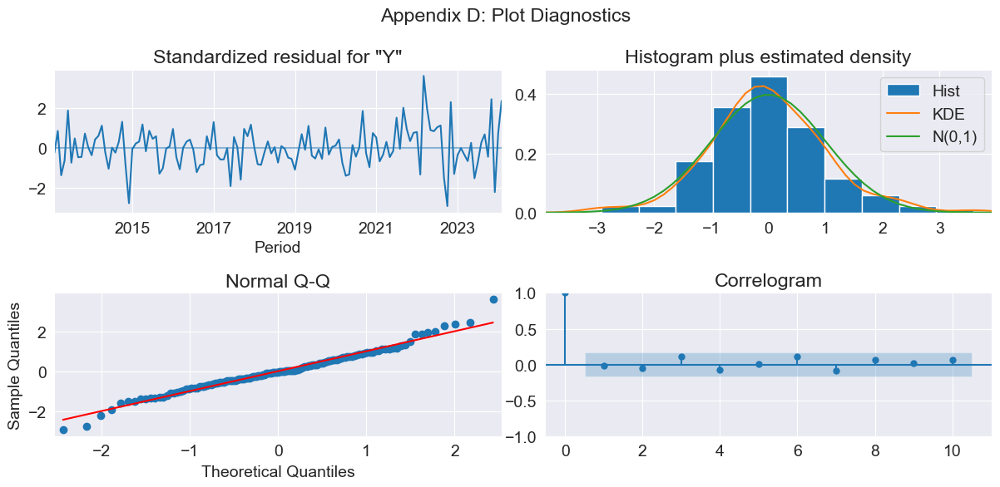

In [ ]:
create_forecast_report({'CHL_0229_7': CHL_data_02_24[best].dropna()}, [], var_model, log_transform =True, walkforward = False)


NameError: name 'best' is not defined

  0%|          | 0/1 [00:00<?, ?it/s]

Training  var_model for  CHL_0229_7


Difference the series


Testing VAR - Walk Forward:   0%|          | 0/69 [00:00<?, ?it/s]

2023-03-01 00:00:00
Variability:  1.0169893381408264


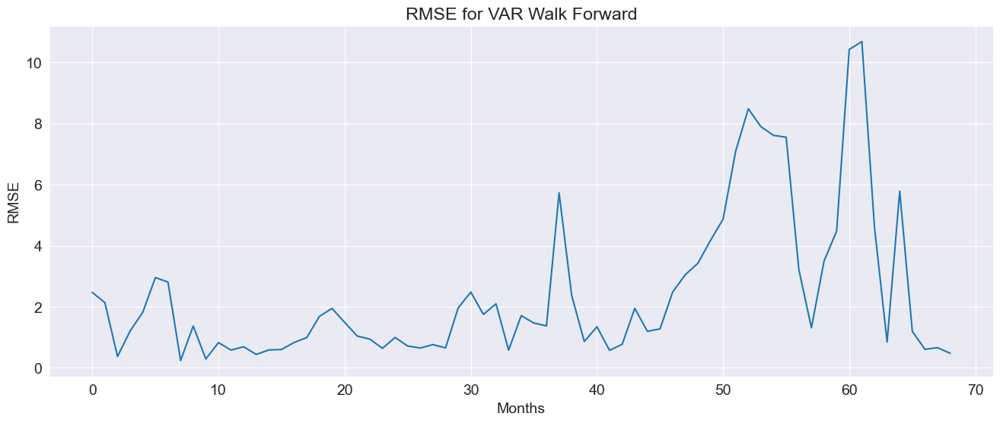

  0%|          | 0/1 [00:00<?, ?it/s]

Training  var_model for  CHL_0229_7
Difference the series


Testing VAR - Walk Forward:   0%|          | 0/69 [00:00<?, ?it/s]

2023-03-01 00:00:00
Variability:  1.0156145678220811


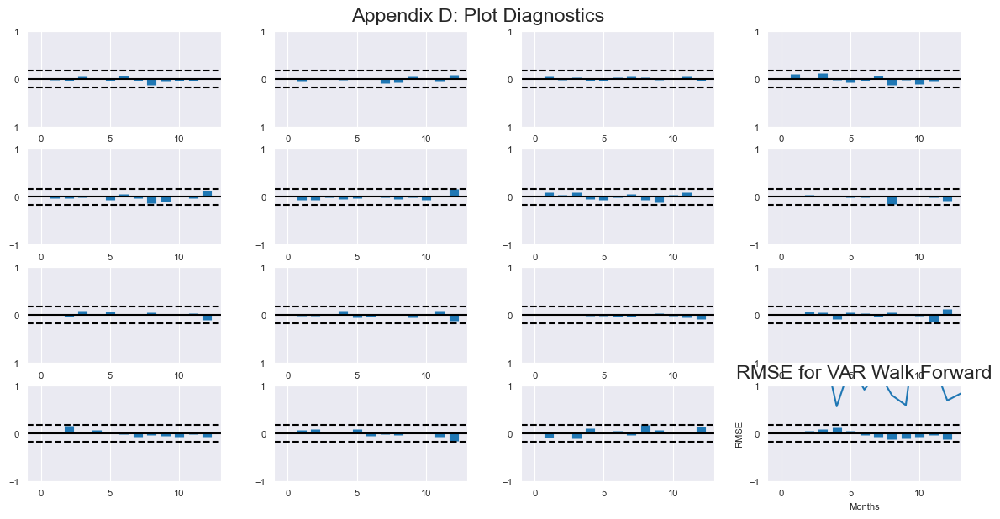

  0%|          | 0/1 [00:00<?, ?it/s]

Training  var_model for  CHL_0229_7
Difference the series


Testing VAR - Walk Forward:   0%|          | 0/69 [00:00<?, ?it/s]

2023-03-01 00:00:00
Variability:  1.126930504026131


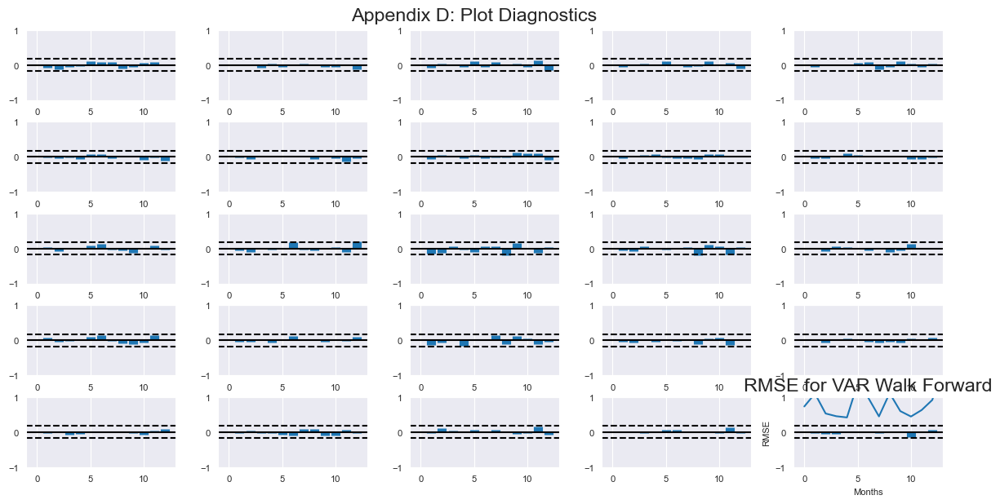

  0%|          | 0/1 [00:00<?, ?it/s]

Training  var_model for  CHL_0229_7
Difference the series


Testing VAR - Walk Forward:   0%|          | 0/69 [00:00<?, ?it/s]

2023-03-01 00:00:00
Variability:  0.920939494574251


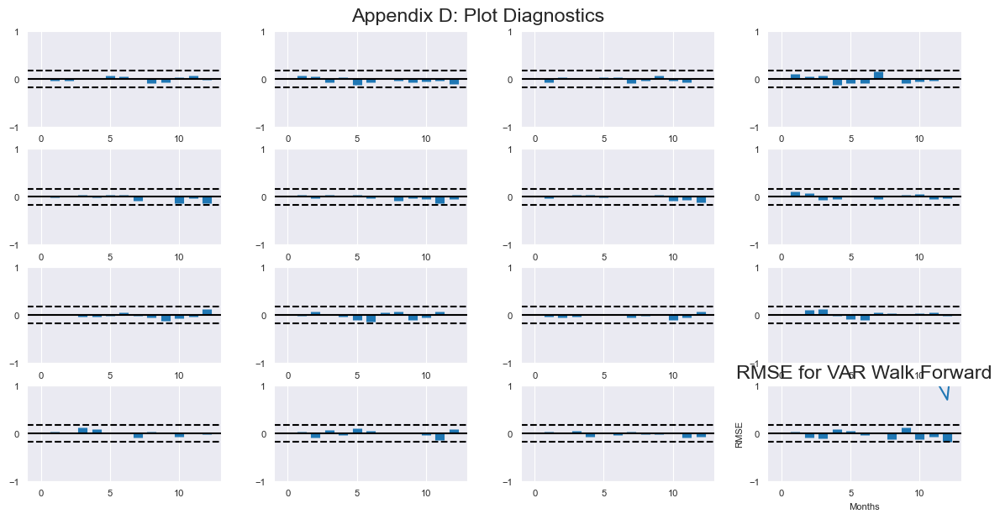

  0%|          | 0/1 [00:00<?, ?it/s]

Training  var_model for  CHL_0229_7
Difference the series


Testing VAR - Walk Forward:   0%|          | 0/69 [00:00<?, ?it/s]

2023-03-01 00:00:00
Variability:  1.0366551860783988


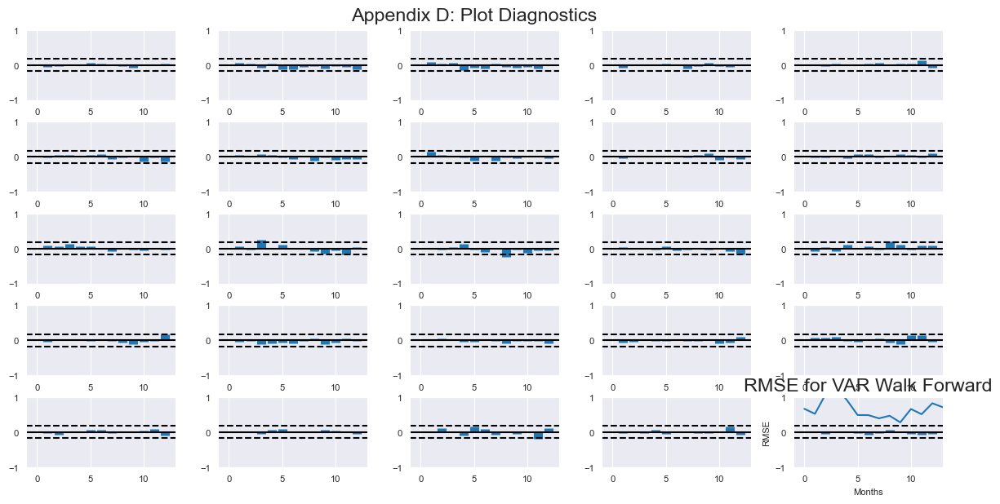

  0%|          | 0/1 [00:00<?, ?it/s]

Training  var_model for  CHL_0229_7
Difference the series


Testing VAR - Walk Forward:   0%|          | 0/69 [00:00<?, ?it/s]

2023-03-01 00:00:00
Variability:  1.0106189384232478


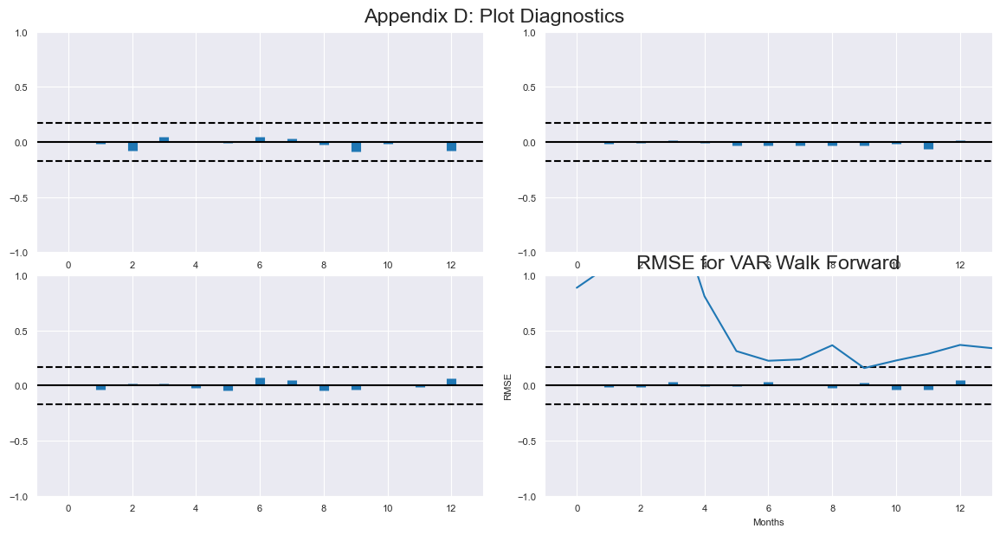

  0%|          | 0/1 [00:00<?, ?it/s]

Training  var_model for  CHL_0229_7
Difference the series
Difference the series


Testing VAR - Walk Forward:   0%|          | 0/69 [00:00<?, ?it/s]

2023-03-01 00:00:00
Variability:  2.898194899066457


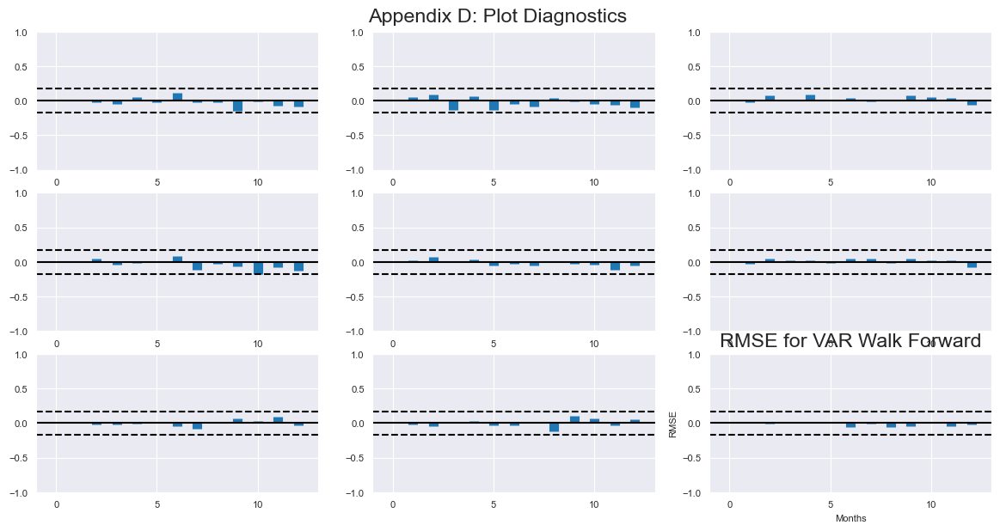

  0%|          | 0/1 [00:06<?, ?it/s]


ValueError: y must by have at least order (12) observations. Got 11.

In [ ]:
for combo in best_combos:   
    create_forecast_report({'CHL_0229_7': CHL_data_02_24[list(set(combo))].dropna()}, [], var_model, log_transform = False, walkforward = True)


In [ ]:
100 * np.mean(np.abs((y_actual.iloc[:,0] - predictions)/y_actual.iloc[:,0]))

In [ ]:
#BRAZIL START
BRA_FILE_NAME = r'dat/2024/January/Banco de Brasil Time Series.xlsx'

sheet_names = pd.ExcelFile(BRA_FILE_NAME).sheet_names

BRA_data = pd.DataFrame()

for sheet in sheet_names: 

    df = pd.read_excel(BRA_FILE_NAME, sheet_name = sheet)
        
    #set index to Period'
    df.set_index('Period', inplace = True)
    #convert index to datetime
    df.index = pd.to_datetime(df.index)
    
    if 'raw' in sheet:
        #get percent change from same period last year
        df = df.pct_change(12)
        df = df.dropna()

    if 'daily' in sheet:
        df = df.resample('MS').interpolate(method='linear')

    #merge exogenous variable data with inflation data
    BRA_data = pd.merge(BRA_data, df, how = 'right', left_index = True, right_index = True)
    

#BRA_data = BRA_data.dropna()
BRA_data.tail()

#show missing values as heatmap
#sns.heatmap(BRA_data.isnull(), cbar=False)


,Current account,YoY Increase Inflation,Unemployment,Index of Economic Activity,Exchange Rate,Target for Federal Funds rate (Selic),Commodities Index Prices
Period,,,,,,,
2023-11-01,-1.41,4.68,14.7,2.38,5.02,12.75,56.99
2023-12-01,-1.32,4.62,14.9,2.45,4.92,12.25,42.77
2024-01-01,NaN,4.51,NaN,NaN,4.93,11.75,45.47
2024-02-01,NaN,4.50,NaN,NaN,4.94,11.25,NaN
2024-03-01,NaN,3.93,NaN,NaN,4.94,11.25,NaN


In [ ]:
bra_data_4_11 = BRA_data['YoY Increase Inflation']
bra_data_4_11

Period
1998-01-01     NaN
1998-02-01     NaN
1998-03-01     NaN
1998-04-01     NaN
1998-05-01     NaN
              ... 
2023-11-01    4.68
2023-12-01    4.62
2024-01-01    4.51
2024-02-01    4.50
2024-03-01    3.93
Name: YoY Increase Inflation, Length: 315, dtype: float64

In [ ]:
CSV_FOLDER = r'dat/2024/January/brasil csv'

#read in all csv files in the folder
for file in os.listdir(CSV_FOLDER):
        df = pd.read_csv(os.path.join(CSV_FOLDER, file), sep = ';')[:-1]
        #replace - with NaN
      
        df.set_index('Date', inplace = True)
        df.index = pd.to_datetime(df.index)
        #print all columns where '-' is present
        #only replace '-' when it is a whole cell value
        df = df.replace(',', '', regex=True)
        df = df.apply(pd.to_numeric, errors='coerce')
#        #get pct change from same period last year
        if (file != 'ipca.csv'):
            df = df.pct_change(12) * 100
        #change data to numeric

        df_columns = df.columns
        #if NONE of the df_columns is already in BRA_data.columns, then merge
        if df_columns.any() not in BRA_data.columns:
            BRA_data = pd.merge(BRA_data, df, how = 'left', left_index = True, right_index = True)
            bra_data_4_11 = pd.merge(bra_data_4_11, df, how = 'left', left_index = True, right_index = True)
        
        


#remove leading numbers and hyphens from column names
BRA_data.columns = BRA_data.columns.str.replace(r'^\d+\s-\s', '')













In [ ]:
BRA_data

,Current account,YoY Increase Inflation,Unemployment,Index of Economic Activity,Exchange Rate,Target for Federal Funds rate (Selic),Commodities Index Prices,National Consumer Price Index (INPC) - Monthly % var.,Broad national consumer price index (IPCA) - Food and beverages - Monthly % var.,Broad national consumer price index (IPCA) - Housing - Monthly % var.,...,Commodity Index - Brazil - Agriculture (in US Dollars) - Index,Minimum wage - c.m.u.,Monetary base - Monetary base (working day balance average) - c.m.u. (thousand),International reserves - Total - monthly - US$ (million),Current account - monthly - net - US$ (million),Real effective overall earnings - R$ (million),Households gross disposable national income (3-months moving average) - R$ (million),"Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)",Commodity Index - Brazil - Index,Commodities Index - Brazil (in US Dollars) - Index
Period,,,,,,,,,,,,,,,,,,,,,
1998-01-01,NaN,NaN,NaN,NaN,NaN,NaN,39.19,0.85,1.24,0.30,...,NaN,7.142857,62.858129,-9.920103,390.397776,NaN,NaN,NaN,NaN,NaN
1998-02-01,NaN,NaN,NaN,NaN,NaN,NaN,38.98,0.54,0.62,0.26,...,NaN,7.142857,41.236685,-1.048733,-25.216992,NaN,NaN,NaN,NaN,NaN
1998-03-01,NaN,NaN,NaN,NaN,NaN,NaN,38.16,0.49,0.79,0.38,...,NaN,7.142857,24.933098,16.300441,8.712121,NaN,NaN,NaN,NaN,NaN
1998-04-01,NaN,NaN,NaN,NaN,NaN,NaN,38.10,0.45,0.85,0.29,...,NaN,7.142857,25.058782,32.908440,-24.376420,NaN,NaN,NaN,NaN,NaN
1998-05-01,NaN,NaN,NaN,NaN,NaN,NaN,38.21,0.72,1.38,0.13,...,NaN,8.333333,32.320343,22.852950,24.226657,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-01,-1.41,4.68,14.7,2.38,5.02,12.75,56.99,0.10,0.63,0.48,...,4.048884,8.910891,3.945944,5.098264,68.572476,4.485964,9.808624,4.785434,-10.638564,-3.930963
2023-12-01,-1.32,4.62,14.9,2.45,4.92,12.25,42.77,0.55,1.11,0.34,...,1.850777,8.910891,2.840956,9.341152,-22.034664,-2.570175,11.334411,6.106747,-12.281196,-6.069144
2024-01-01,NaN,4.51,NaN,NaN,4.93,11.75,45.47,0.57,1.38,0.25,...,1.457425,8.448541,1.499755,7.231172,-43.456578,-2.487609,11.871182,6.210732,-9.246854,-3.908912


In [ ]:
causality_matrix = grangers_causation_matrix(BRA_data, variables = BRA_data.columns)
causality_matrix


MissingDataError: exog contains inf or nans

  0%|          | 0/1 [00:00<?, ?it/s]

searching for best parameters for ARIMA model...
Training  arima for  BRA_411
Fitting ARIMA model for:  BRA_411


100%|██████████| 1/1 [01:43<00:00, 103.96s/it]


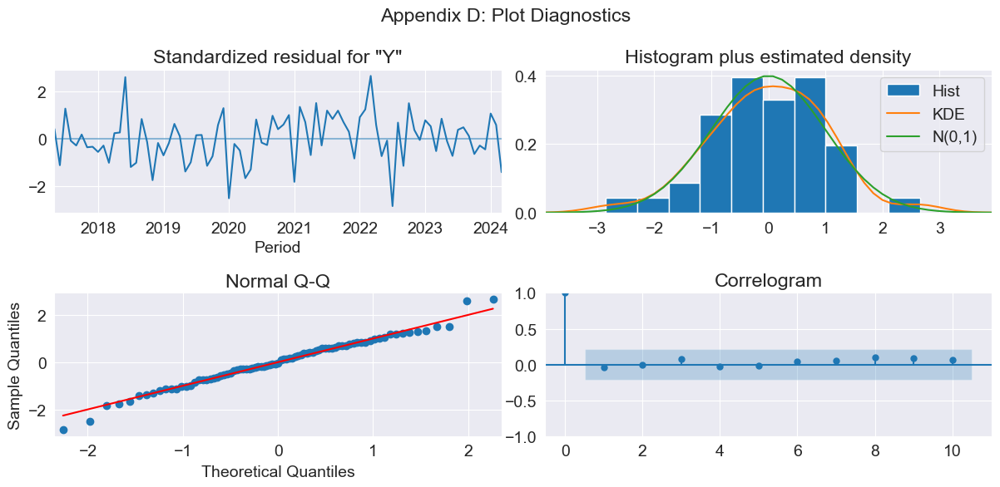

In [ ]:
#run arima for brazil
create_forecast_report({'BRA_411': bra_data_4_11}, [], arima, log_transform = False, walkforward = False)

In [ ]:
#get best predictors
final_predictors = get_best_predictors(causality_matrix)

In [ ]:
#make list of best predictors containing IPCA or INPC
components = [col for col in final_predictors if '(IPCA)' in col or '(INPC)' in col]
components

['National Consumer Price Index (INPC) - Monthly percent var.',
 'Broad national consumer price index (IPCA) - Food and beverages - Monthly percent var.',
 'Broad national consumer price index (IPCA) - Housing - Monthly percent var.',
 'Broad national consumer price index (IPCA) - Transport - Monthly percent var.']

In [ ]:
#non-components = list of best predictors that are not in components
non_components = [col for col in final_predictors if col not in components]
non_components

['Target for Federal Funds rate (Selic)',
 'Commodities Index Prices',
 'Commodity Index - Brazil - Energy (in US Dollars) - Index',
 'Commodity Index - Brazil - Metal (in US Dollars) - Index',
 'Commodity Index - Brazil - Agriculture (in US Dollars) - Index',
 'Minimum wage - c.m.u.',
 'Monetary base - Monetary base (working day balance average) - c.m.u. (thousand)',
 'International reserves - Total - monthly - US$ (million)',
 'Real effective overall earnings - R$ (million)',
 'Households gross disposable national income (3-months moving average) - R$ (million)',
 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)']

In [ ]:
bra_results = run_var_for_all_combos(BRA_data, components)
bra_results[(bra_results['Stationary'] == True) & (bra_results['Error Correlation'] == 'No Serial Correlation')].head(10)

15


 20%|██        | 3/15 [00:00<00:03,  3.96it/s]

100%|██████████| 15/15 [00:04<00:00,  3.22it/s]


,Combination,RMSE,MAPE,Correlation,Stationary,Times Differenced,Error Correlation
9,"(YoY Increase Inflation, Broad national consumer price index (IPCA) - Housing - Monthly percent var., Broad national consumer price index (IPCA) - Transport - Monthly percent var.)",0.319400,0.055469,0.940264,True,1,No Serial Correlation
14,"(YoY Increase Inflation, National Consumer Price Index (INPC) - Monthly percent var., Broad national consumer price index (IPCA) - Food and beverages - Monthly percent var., Broad national consumer price index (IPCA) - Housing - Monthly percent var., Broad national consumer price index (IPCA) - Transport - Monthly percent var.)",0.419770,0.070452,0.890908,True,1,No Serial Correlation
4,"(YoY Increase Inflation, National Consumer Price Index (INPC) - Monthly percent var., Broad national consumer price index (IPCA) - Food and beverages - Monthly percent var.)",0.620592,0.125047,0.972458,True,1,No Serial Correlation
13,"(YoY Increase Inflation, Broad national consumer price index (IPCA) - Food and beverages - Monthly percent var., Broad national consumer price index (IPCA) - Housing - Monthly percent var., Broad national consumer price index (IPCA) - Transport - Monthly percent var.)",0.697067,0.143331,0.922808,True,1,No Serial Correlation
10,"(YoY Increase Inflation, National Consumer Price Index (INPC) - Monthly percent var., Broad national consumer price index (IPCA) - Food and beverages - Monthly percent var., Broad national consumer price index (IPCA) - Housing - Monthly percent var.)",0.804199,0.156780,0.851660,True,1,No Serial Correlation
2,"(YoY Increase Inflation, Broad national consumer price index (IPCA) - Housing - Monthly percent var.)",0.897401,0.169308,0.862285,True,1,No Serial Correlation
12,"(YoY Increase Inflation, National Consumer Price Index (INPC) - Monthly percent var., Broad national consumer price index (IPCA) - Housing - Monthly percent var., Broad national consumer price index (IPCA) - Transport - Monthly percent var.)",0.954460,0.199849,0.901387,True,1,No Serial Correlation
5,"(YoY Increase Inflation, National Consumer Price Index (INPC) - Monthly percent var., Broad national consumer price index (IPCA) - Housing - Monthly percent var.)",1.175151,0.245971,0.891097,True,1,No Serial Correlation
11,"(YoY Increase Inflation, National Consumer Price Index (INPC) - Monthly percent var., Broad national consumer price index (IPCA) - Food and beverages - Monthly percent var., Broad national consumer price index (IPCA) - Transport - Monthly percent var.)",1.369344,0.292391,0.893391,True,1,No Serial Correlation
7,"(YoY Increase Inflation, Broad national consumer price index (IPCA) - Food and beverages - Monthly percent var., Broad national consumer price index (IPCA) - Housing - Monthly percent var.)",1.447011,0.292626,0.805865,True,1,No Serial Correlation


In [ ]:
bra_results = run_var_for_all_combos(BRA_data, non_components)
bra_results[(bra_results['Stationary'] == True) & (bra_results['Error Correlation'] == 'No Serial Correlation')].head(10)

2047


  0%|          | 0/2047 [00:00<?, ?it/s]

100%|██████████| 2047/2047 [36:05<00:00,  1.06s/it]


,Combination,RMSE,MAPE,Correlation,Stationary,Times Differenced,Error Correlation
421,"(YoY Increase Inflation, Commodities Index Prices, Minimum wage - c.m.u., International reserves - Total - monthly - US$ (million), Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million))",0.556069,0.104473,0.798470,True,1,No Serial Correlation
420,"(YoY Increase Inflation, Commodities Index Prices, Minimum wage - c.m.u., International reserves - Total - monthly - US$ (million), Households gross disposable national income (3-months moving average) - R$ (million))",0.634473,0.093096,0.820731,True,1,No Serial Correlation
423,"(YoY Increase Inflation, Commodities Index Prices, Minimum wage - c.m.u., Real effective overall earnings - R$ (million), Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million))",0.670457,0.124610,0.590869,True,1,No Serial Correlation
219,"(YoY Increase Inflation, Minimum wage - c.m.u., Real effective overall earnings - R$ (million), Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million))",0.726913,0.137576,0.571354,True,1,No Serial Correlation
218,"(YoY Increase Inflation, Minimum wage - c.m.u., Real effective overall earnings - R$ (million), Households gross disposable national income (3-months moving average) - R$ (million))",0.819654,0.159508,0.570412,True,1,No Serial Correlation
64,"(YoY Increase Inflation, Real effective overall earnings - R$ (million), Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million))",0.851182,0.167235,0.555739,True,1,No Serial Correlation
63,"(YoY Increase Inflation, Real effective overall earnings - R$ (million), Households gross disposable national income (3-months moving average) - R$ (million))",0.939456,0.186106,0.530506,True,1,No Serial Correlation
53,"(YoY Increase Inflation, Minimum wage - c.m.u., Real effective overall earnings - R$ (million))",0.943946,0.187175,0.569694,True,1,No Serial Correlation
8,"(YoY Increase Inflation, Real effective overall earnings - R$ (million))",1.056925,0.214861,0.494271,True,1,No Serial Correlation
27,"(YoY Increase Inflation, Commodities Index Prices, Real effective overall earnings - R$ (million))",1.057182,0.214936,0.522634,True,1,No Serial Correlation


In [ ]:
BRA_data.columns

Index(['Current account', 'YoY Increase Inflation', 'Unemployment',
       'Index of Economic Activity', 'Exchange Rate',
       'Target for Federal Funds rate (Selic)', 'Commodities Index Prices',
       'National Consumer Price Index (INPC) - Monthly % var.',
       'Broad national consumer price index (IPCA) - Food and beverages - Monthly % var.',
       'Broad national consumer price index (IPCA) - Housing - Monthly % var.',
       'Broad national consumer price index (IPCA) - Transport - Monthly % var.',
       'Broad National Consumer Price Index (IPCA) - Services - Monthly % var.',
       'Broad national consumer price index (IPCA) - in 12 months - %',
       'Unemployment rate - PNADC - %,',
       'Commodity Index - Brazil - Energy (in US Dollars) - Index',
       'Commodity Index - Brazil - Metal (in US Dollars) - Index',
       'Commodity Index - Brazil - Agriculture (in US Dollars) - Index',
       'Minimum wage - c.m.u.',
       'Monetary base - Monetary base (working day 

In [ ]:
predictors = ['YoY Increase Inflation', 'Commodity Index - Brazil - Index',
       'Commodities Index - Brazil (in US Dollars) - Index','Commodities Index Prices', 'Minimum wage - c.m.u.', 'International reserves - Total - monthly - US$ (million)', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)']

bra_201 = BRA_data[predictors][:-1]
bra_201 = bra_201.drop(columns = ['Commodities Index Prices'])
bra_201 = bra_201.dropna()

#assign value of 20 to Commodities Index Prices at 2024-02-01
#bra_201.loc['2024-02-01', 'Commodities Index Prices'] = 20
bra_201



,YoY Increase Inflation,Commodity Index - Brazil - Index,Commodities Index - Brazil (in US Dollars) - Index,Minimum wage - c.m.u.,International reserves - Total - monthly - US$ (million),"Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)"
Period,,,,,,
2014-03-01,6.15,17.109316,-0.130086,6.784661,-3.454186,5.565607
2014-04-01,6.28,15.913906,3.889260,6.784661,-3.155296,4.628918
2014-05-01,6.37,13.613673,4.098546,6.784661,-1.513019,3.049207
2014-06-01,6.52,7.675562,4.605011,6.784661,1.113692,2.223141
2014-07-01,6.50,3.696099,4.987551,6.784661,1.297430,2.132488
...,...,...,...,...,...,...
2023-10-01,4.82,-4.658826,-1.198859,8.910891,4.515798,4.694965
2023-11-01,4.68,-10.638564,-3.930963,8.910891,5.098264,4.785434
2023-12-01,4.62,-12.281196,-6.069144,8.910891,9.341152,6.106747


In [ ]:
#granger causality
causality_matrix = grangers_causation_matrix(bra_201, variables = bra_201.columns)
causality_matrix

data is not stationary YoY Increase Inflation YoY Increase Inflation
data is not stationary YoY Increase Inflation Commodity Index - Brazil - Index
data is not stationary YoY Increase Inflation Commodities Index - Brazil (in US Dollars) - Index
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
data is not stationary YoY Increase Inflation International reserves - Total - monthly - US$ (million)
data is not stationary YoY Increase Inflation Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)


,YoY Increase Inflation_x,Commodity Index - Brazil - Index_x,Commodities Index - Brazil (in US Dollars) - Index_x,Minimum wage - c.m.u._x,International reserves - Total - monthly - US$ (million)_x,"Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)_x"
YoY Increase Inflation_y,0.0,0.0,0.0,0.0309,0.0,0.0
Commodity Index - Brazil - Index_y,0.0,0.0,0.0,0.2276,0.0,0.0
Commodities Index - Brazil (in US Dollars) - Index_y,0.0,0.0,0.0,0.0025,0.0,0.0
Minimum wage - c.m.u._y,0.0,0.0,0.0,1.0000,0.0,0.0
International reserves - Total - monthly - US$ (million)_y,0.0,0.0,0.0,0.5358,0.0,0.0
"Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)_y",0.0,0.0,0.0,0.1678,0.0,0.0


In [ ]:
final = get_best_predictors(causality_matrix)

In [ ]:
#remove _y from final
final = [re.sub(r'_y$', '', f) for f in final]
final = final[1:]

In [ ]:
#run var for all combinations of final
results = run_var_for_all_combos(bra_201, final)
results

31


  6%|▋         | 2/31 [00:00<00:02, 12.06it/s]

Lowest MAPE:  0.5927086403559637 Best Combination:  ('YoY Increase Inflation', 'Commodity Index - Brazil - Index')
Lowest MAPE:  0.5927086403559637 Best Combination:  ('YoY Increase Inflation', 'Commodity Index - Brazil - Index')


 13%|█▎        | 4/31 [00:00<00:02, 12.00it/s]

Lowest MAPE:  0.23557028631804533 Best Combination:  ('YoY Increase Inflation', 'Minimum wage - c.m.u.')
Lowest MAPE:  0.23557028631804533 Best Combination:  ('YoY Increase Inflation', 'Minimum wage - c.m.u.')
Lowest MAPE:  0.19965715297984277 Best Combination:  ('YoY Increase Inflation', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')


 26%|██▌       | 8/31 [00:00<00:01, 12.32it/s]

Lowest MAPE:  0.19965715297984277 Best Combination:  ('YoY Increase Inflation', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')
Lowest MAPE:  0.19965715297984277 Best Combination:  ('YoY Increase Inflation', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')
Lowest MAPE:  0.19965715297984277 Best Combination:  ('YoY Increase Inflation', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')
Lowest MAPE:  0.19965715297984277 Best Combination:  ('YoY Increase Inflation', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')


 39%|███▊      | 12/31 [00:00<00:01, 12.30it/s]

Lowest MAPE:  0.19965715297984277 Best Combination:  ('YoY Increase Inflation', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')
Lowest MAPE:  0.19965715297984277 Best Combination:  ('YoY Increase Inflation', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')
Lowest MAPE:  0.19965715297984277 Best Combination:  ('YoY Increase Inflation', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')


 52%|█████▏    | 16/31 [00:01<00:01, 13.85it/s]

Lowest MAPE:  0.19965715297984277 Best Combination:  ('YoY Increase Inflation', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')
Lowest MAPE:  0.15075763499095846 Best Combination:  ('YoY Increase Inflation', 'Minimum wage - c.m.u.', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')
Lowest MAPE:  0.15075763499095846 Best Combination:  ('YoY Increase Inflation', 'Minimum wage - c.m.u.', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')
Lowest MAPE:  0.15075763499095846 Best Combination:  ('YoY Increase Inflation', 'Minimum wage - c.m.u.', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')


 58%|█████▊    | 18/31 [00:01<00:01, 12.71it/s]

Lowest MAPE:  0.15075763499095846 Best Combination:  ('YoY Increase Inflation', 'Minimum wage - c.m.u.', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')
Lowest MAPE:  0.15075763499095846 Best Combination:  ('YoY Increase Inflation', 'Minimum wage - c.m.u.', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')
Lowest MAPE:  0.15075763499095846 Best Combination:  ('YoY Increase Inflation', 'Minimum wage - c.m.u.', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')


 71%|███████   | 22/31 [00:01<00:00, 13.09it/s]

Lowest MAPE:  0.15075763499095846 Best Combination:  ('YoY Increase Inflation', 'Minimum wage - c.m.u.', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')
Lowest MAPE:  0.15075763499095846 Best Combination:  ('YoY Increase Inflation', 'Minimum wage - c.m.u.', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')
Lowest MAPE:  0.15075763499095846 Best Combination:  ('YoY Increase Inflation', 'Minimum wage - c.m.u.', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')


 77%|███████▋  | 24/31 [00:01<00:00, 12.49it/s]

Lowest MAPE:  0.15075763499095846 Best Combination:  ('YoY Increase Inflation', 'Minimum wage - c.m.u.', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')
Lowest MAPE:  0.15075763499095846 Best Combination:  ('YoY Increase Inflation', 'Minimum wage - c.m.u.', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')
Lowest MAPE:  0.15075763499095846 Best Combination:  ('YoY Increase Inflation', 'Minimum wage - c.m.u.', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')


 84%|████████▍ | 26/31 [00:02<00:00, 12.19it/s]

Lowest MAPE:  0.15075763499095846 Best Combination:  ('YoY Increase Inflation', 'Minimum wage - c.m.u.', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')
Lowest MAPE:  0.14510721261894696 Best Combination:  ('YoY Increase Inflation', 'Commodity Index - Brazil - Index', 'Commodities Index - Brazil (in US Dollars) - Index', 'Minimum wage - c.m.u.', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')


 90%|█████████ | 28/31 [00:02<00:00, 10.97it/s]

Lowest MAPE:  0.14510721261894696 Best Combination:  ('YoY Increase Inflation', 'Commodity Index - Brazil - Index', 'Commodities Index - Brazil (in US Dollars) - Index', 'Minimum wage - c.m.u.', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')
Lowest MAPE:  0.14510721261894696 Best Combination:  ('YoY Increase Inflation', 'Commodity Index - Brazil - Index', 'Commodities Index - Brazil (in US Dollars) - Index', 'Minimum wage - c.m.u.', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')


100%|██████████| 31/31 [00:02<00:00, 11.76it/s]

Lowest MAPE:  0.14510721261894696 Best Combination:  ('YoY Increase Inflation', 'Commodity Index - Brazil - Index', 'Commodities Index - Brazil (in US Dollars) - Index', 'Minimum wage - c.m.u.', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')
Lowest MAPE:  0.14510721261894696 Best Combination:  ('YoY Increase Inflation', 'Commodity Index - Brazil - Index', 'Commodities Index - Brazil (in US Dollars) - Index', 'Minimum wage - c.m.u.', 'Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million)')


,Combination,RMSE,MAPE,Correlation,Stationary,Times Differenced,Error Correlation
13,"(YoY Increase Inflation, Minimum wage - c.m.u., Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million))",0.787355,0.150758,-0.281790,True,1,No Serial Correlation
30,"(YoY Increase Inflation, Commodity Index - Brazil - Index, Commodities Index - Brazil (in US Dollars) - Index, Minimum wage - c.m.u., International reserves - Total - monthly - US$ (million), Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million))",0.812353,0.153482,0.786711,False,2,No Serial Correlation
26,"(YoY Increase Inflation, Commodity Index - Brazil - Index, Commodities Index - Brazil (in US Dollars) - Index, Minimum wage - c.m.u., Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million))",0.887915,0.145107,0.659434,False,2,No Serial Correlation
12,"(YoY Increase Inflation, Minimum wage - c.m.u., International reserves - Total - monthly - US$ (million))",1.014054,0.215010,-0.277010,True,1,No Serial Correlation
18,"(YoY Increase Inflation, Commodity Index - Brazil - Index, Minimum wage - c.m.u., International reserves - Total - monthly - US$ (million))",1.016321,0.215746,-0.275564,True,1,No Serial Correlation
6,"(YoY Increase Inflation, Commodity Index - Brazil - Index, Minimum wage - c.m.u.)",1.079858,0.233475,-0.283198,True,1,No Serial Correlation
2,"(YoY Increase Inflation, Minimum wage - c.m.u.)",1.087497,0.235570,-0.285704,True,1,No Serial Correlation
4,"(YoY Increase Inflation, Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million))",1.121250,0.199657,0.558394,True,1,No Serial Correlation
17,"(YoY Increase Inflation, Commodity Index - Brazil - Index, Commodities Index - Brazil (in US Dollars) - Index, Households gross disposable national income (deflated by IPCA, seasonally adjusted, 3-months moving average) - R$ (million))",1.255562,0.229153,0.097915,False,2,No Serial Correlation
3,"(YoY Increase Inflation, International reserves - Total - monthly - US$ (million))",1.289917,0.246894,0.718505,True,1,No Serial Correlation


In [ ]:
best = list(results['Combination'].iloc[1])

NameError: name 'results' is not defined

In [ ]:
create_forecast_report({'BRA_201': bra_201[best].dropna()}, [], var_model, log_transform = True, walkforward = False)

NameError: name 'bra_201' is not defined

  0%|          | 0/1 [00:00<?, ?it/s]

searching for best parameters for ARIMA model...
Training  arima for  BRA_201
Fitting ARIMA model for:  BRA_201


100%|██████████| 1/1 [01:43<00:00, 103.69s/it]


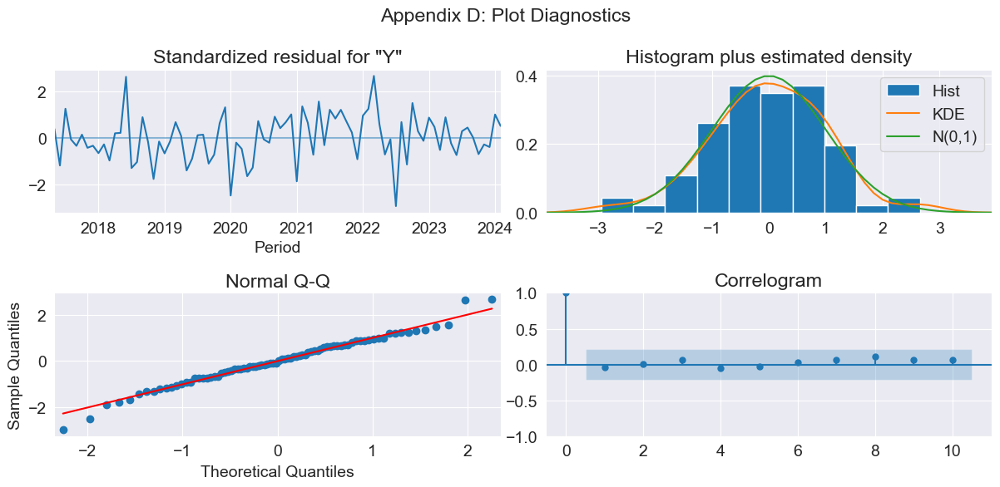

In [ ]:
create_forecast_report({'BRA_201': bra_201[best].dropna()}, [], arima, log_transform = False, walkforward = False)